In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import matplotlib as mpl
import numpy as np
from scipy.interpolate import interp1d
import re
mpl.rcParams['svg.fonttype'] = 'none'
from scipy.optimize import root_scalar
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import glob
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import gaussian_kde
from math import sqrt, pi
import pickle
from collections import defaultdict
from itertools import product
import gurobipy as gp
from gurobipy import GRB
import itertools

## 데이터

### 데이터 불러오기

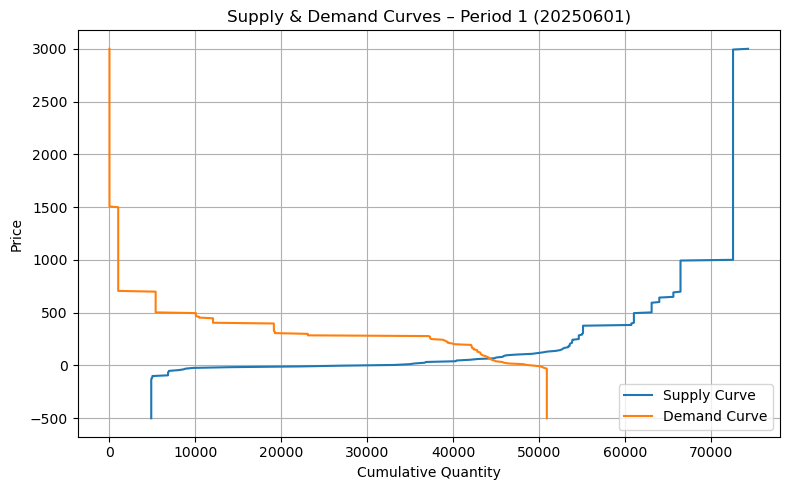

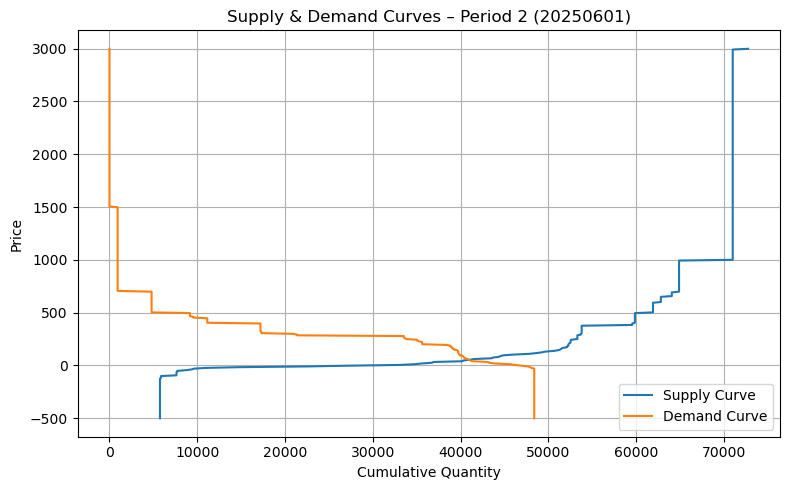

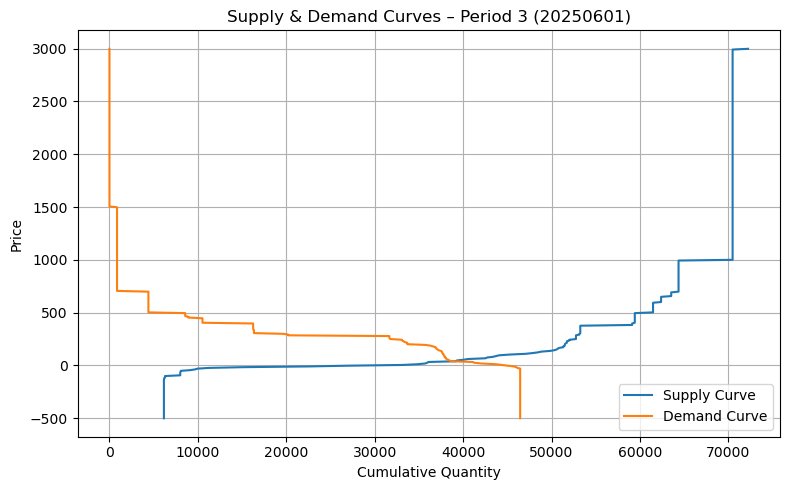

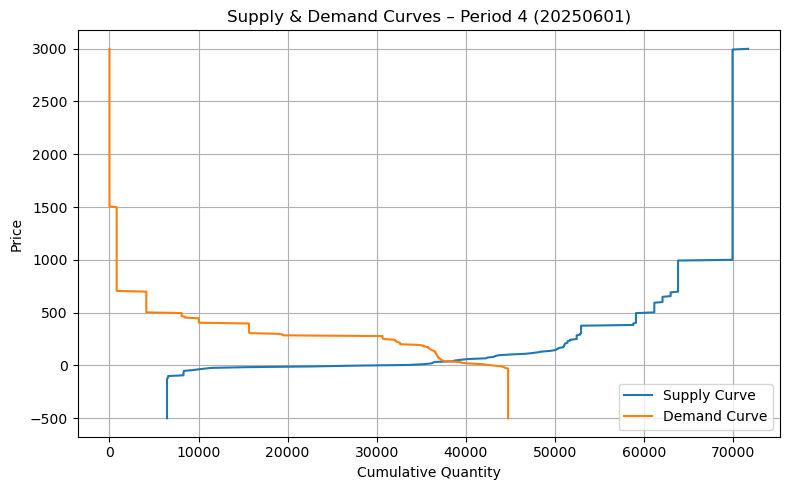

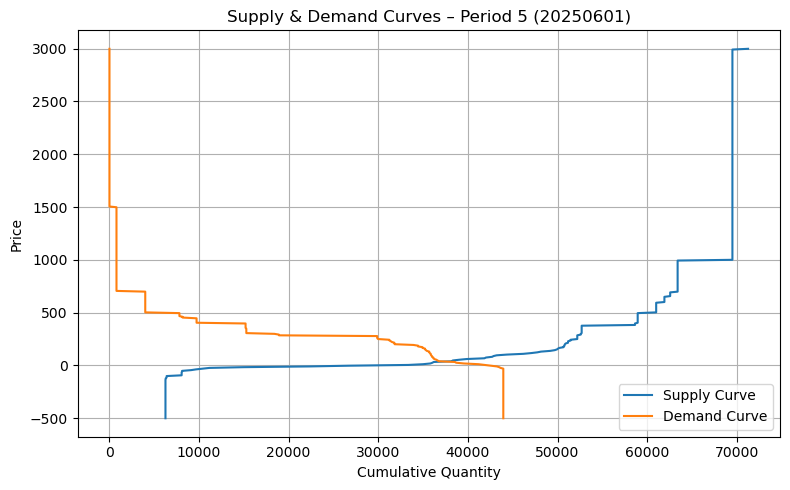

...

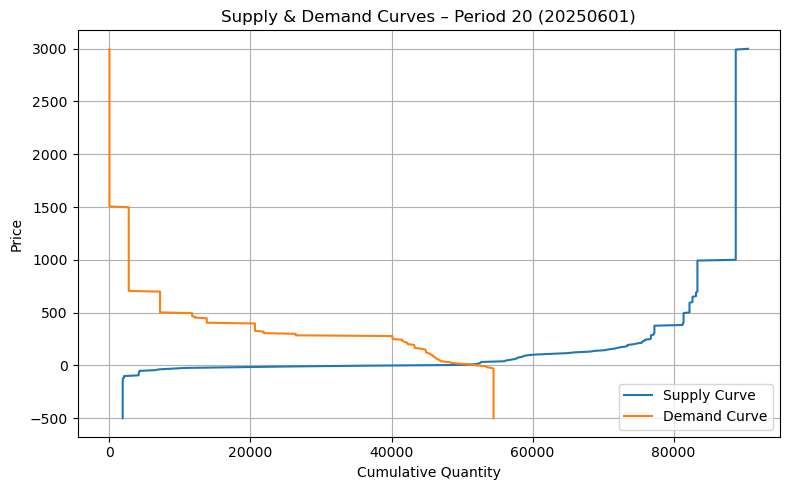

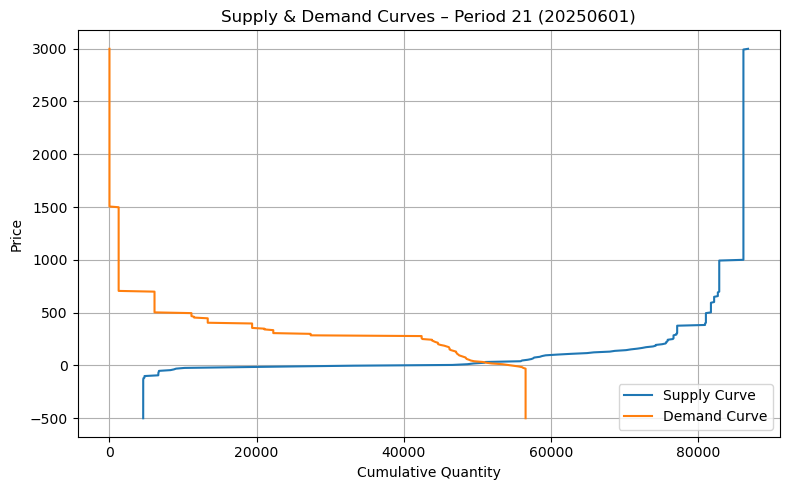

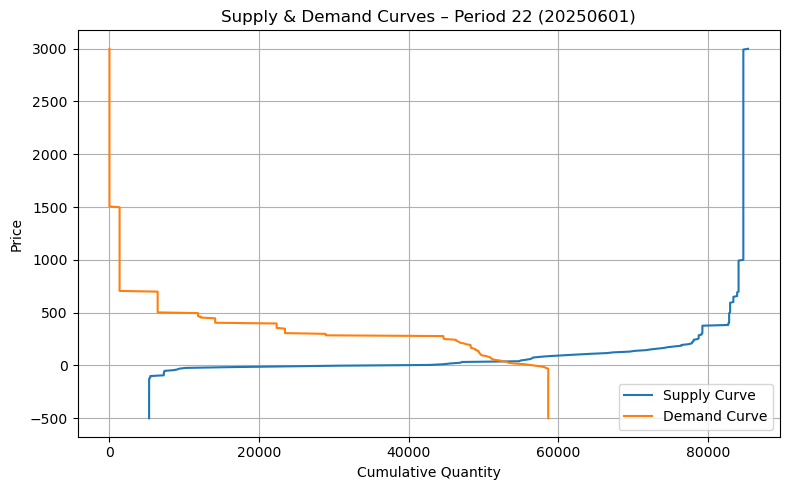

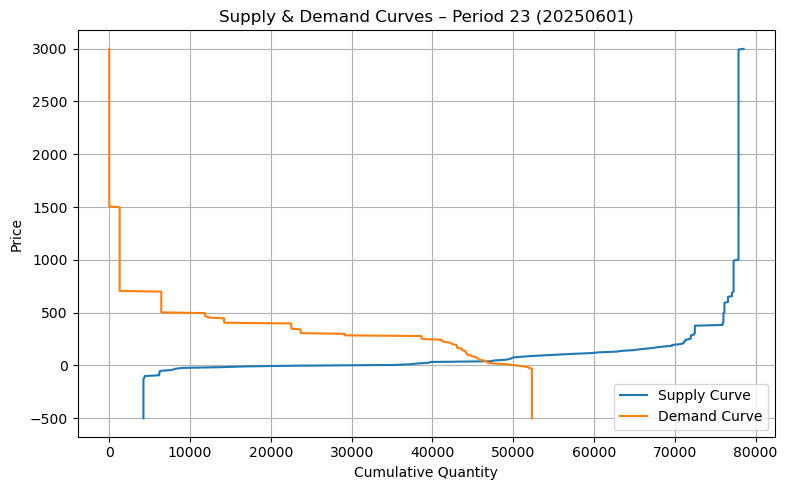

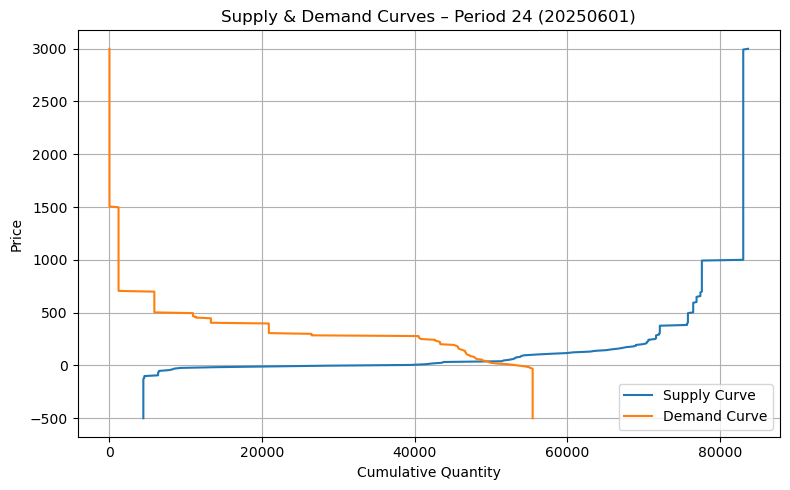

In [2]:
# --------------------------
# 대상 날짜 지정
# --------------------------
date_str = "20250601"
file_in = f"filteredcurve_{date_str}.csv"

# 파일 불러오기
try:
    df = pd.read_csv(file_in, sep=',', encoding='utf-8-sig')
except FileNotFoundError:
    print(f"파일 없음: {file_in}")
    raise

# --------------------------
# 24시간(Period 1~24) 반복
# --------------------------
for period in range(1, 25):  # 1~24
    mask = df['Time Period'] == period
    supply = df[mask & (df['GC'] == 'V')]
    demand = df[mask & (df['GC'] == 'C')]

    if supply.empty or demand.empty:
        print(f"{date_str} Period {period}: 데이터 없음, 건너뜀")
        continue

    # 공급 집계
    supply_agg = (
        supply.groupby('Price')['Amount']
              .sum()
              .reset_index()
              .sort_values('Price')
    )
    supply_agg['CumulQty'] = supply_agg['Amount'].cumsum()

    # 수요 집계
    demand_agg = (
        demand.groupby('Price')['Amount']
              .sum()
              .reset_index()
              .sort_values('Price')
    )
    demand_agg['CumulQty'] = demand_agg['Amount'][::-1].cumsum()[::-1]

    # 보간 함수
    supply_func = interp1d(
        supply_agg['Price'], supply_agg['CumulQty'],
        kind='previous', bounds_error=False,
        fill_value=(0, supply_agg['CumulQty'].iloc[-1])
    )
    demand_func = interp1d(
        demand_agg['Price'], demand_agg['CumulQty'],
        kind='previous', bounds_error=False,
        fill_value=(demand_agg['CumulQty'].iloc[0], 0)
    )

    # 가격 그리드
    pmin = min(supply_agg['Price'].min(), demand_agg['Price'].min())
    pmax = max(supply_agg['Price'].max(), demand_agg['Price'].max())
    price_grid = np.linspace(pmin, pmax, 500)
    supply_vals = supply_func(price_grid)
    demand_vals = demand_func(price_grid)

    # 플롯
    plt.figure(figsize=(8,5))
    plt.plot(supply_vals, price_grid, label='Supply Curve')
    plt.plot(demand_vals, price_grid, label='Demand Curve')
    plt.xlabel('Cumulative Quantity')
    plt.ylabel('Price')
    plt.title(f'Supply & Demand Curves – Period {period} ({date_str})')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## 시나리오

### 시나리오 generation

수요 공급선 시나리오 생성

In [3]:
# # --------------------------
# # 원본 데이터 로드
# # --------------------------
# date_str = "20250601"
# file_in = f"filteredcurve_{date_str}.csv"

# df = pd.read_csv(file_in, sep=',', encoding='utf-8-sig')

# # --------------------------
# # 노이즈 추가 함수
# # --------------------------
# def add_noise(df, sigma=0.05, random_state=None):
#     rng = np.random.default_rng(random_state)
#     noisy_df = df.copy()
#     # Amount에 노이즈 추가 (±σ 비율)
#     noise = rng.normal(0, sigma, size=len(noisy_df))
#     noisy_df['Amount'] = noisy_df['Amount'] * (1 + noise)
#     noisy_df['Amount'] = noisy_df['Amount'].clip(lower=0)  # 음수 방지
#     return noisy_df

# # --------------------------
# # 시나리오 10개 생성
# # --------------------------
# n_scenarios = 10
# scenario_dfs = []

# outdir = "scenarios_20250601"
# os.makedirs(outdir, exist_ok=True)

# for s in range(1, n_scenarios + 1):
#     noisy_df = add_noise(df, sigma=0.05, random_state=s)
#     scenario_dfs.append(noisy_df)
    
#     # 파일로 저장 (원하면)
#     outpath = os.path.join(outdir, f"{date_str}_scenario{s:02d}.csv")
#     noisy_df.to_csv(outpath, sep=',', encoding='utf-8-sig', index=False)
#     print(f"Saved: {outpath}")

# print("scenarion generation complete!")

수요 공급선 시나리오 확인

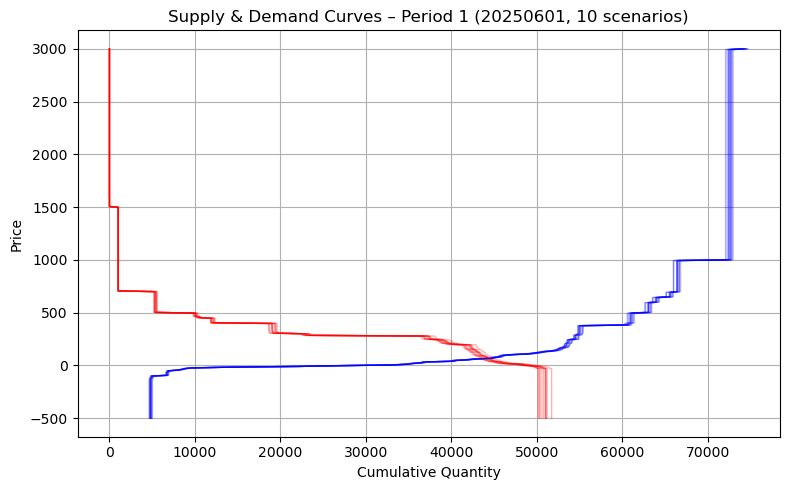

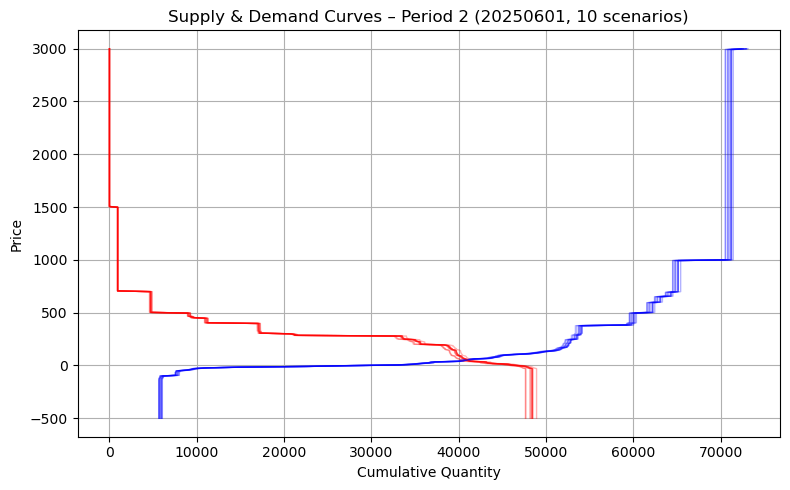

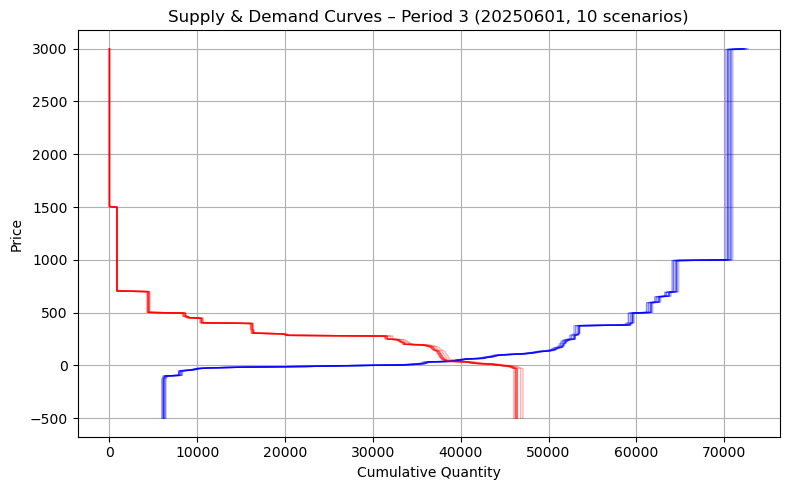

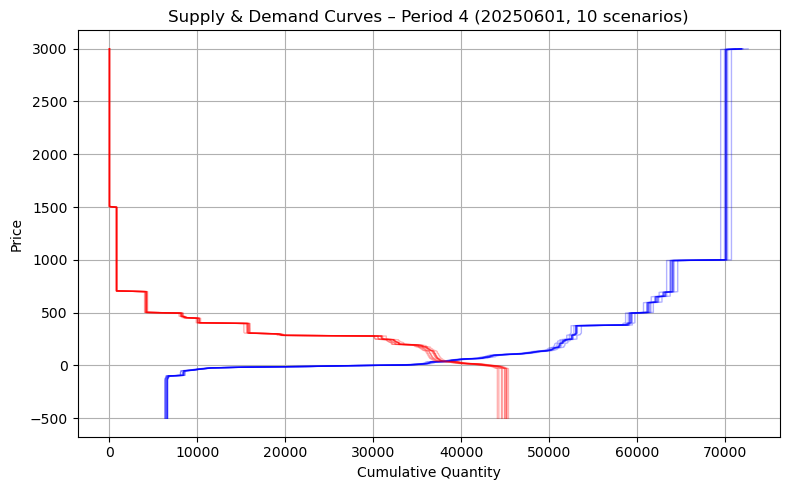

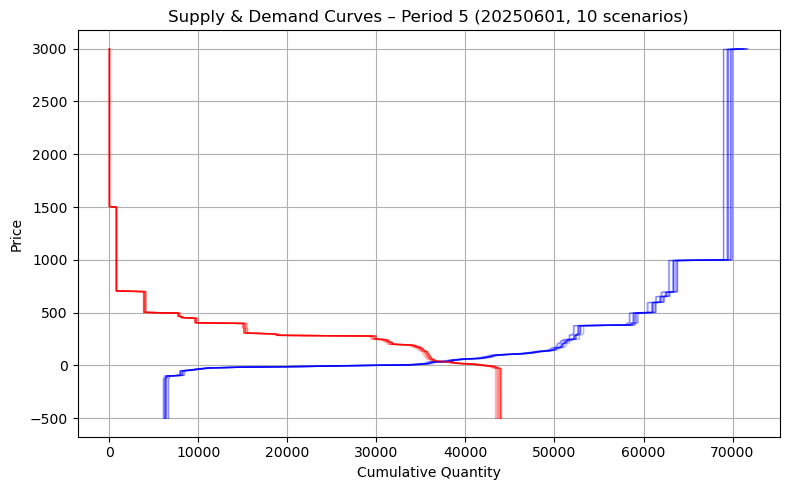

...

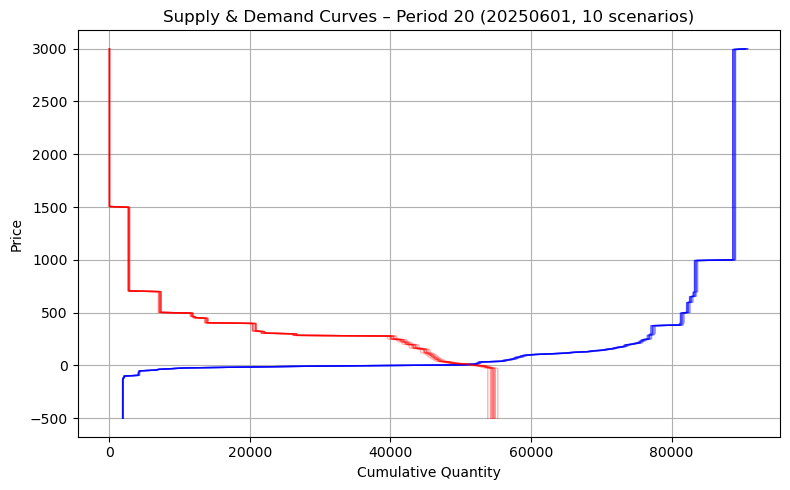

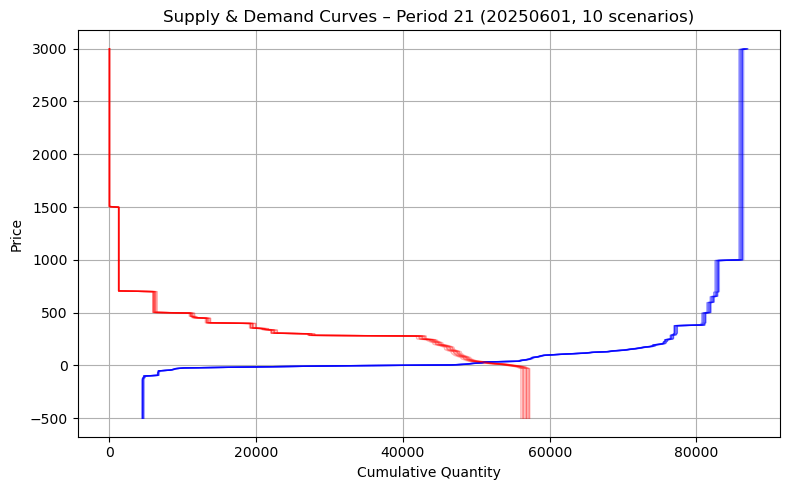

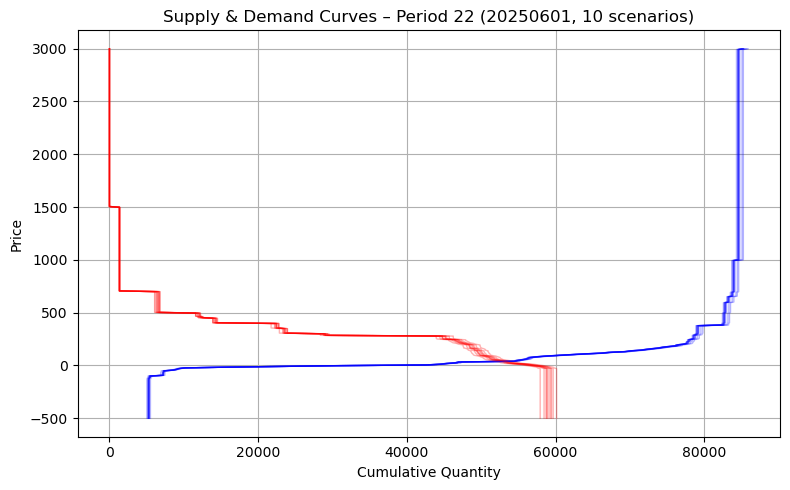

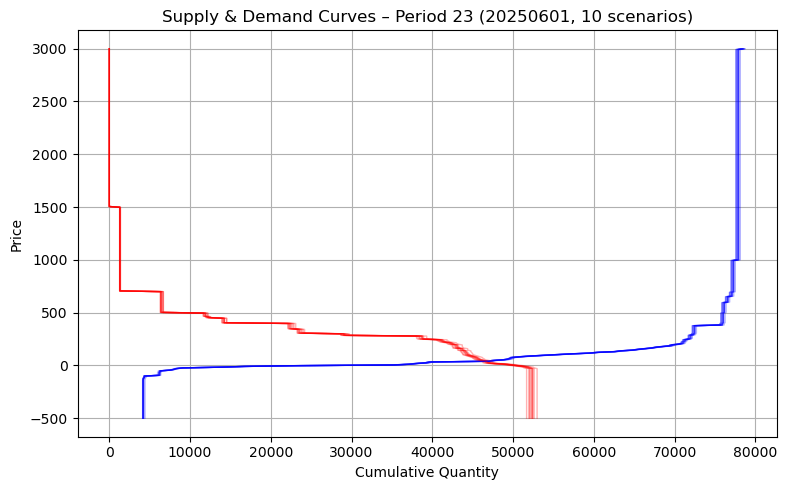

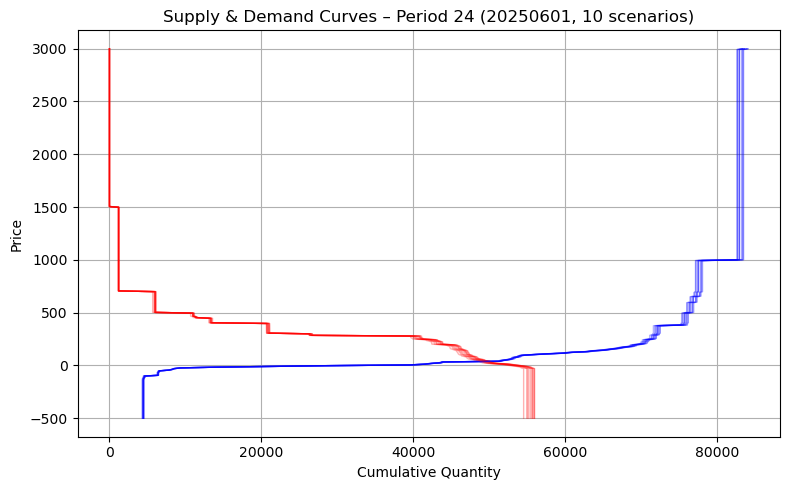

In [4]:
def load_curves_from_path(file_path, period):
    """시나리오 파일 경로 + 시간(period)로 공급/수요 곡선 반환"""
    df = pd.read_csv(file_path, sep=',', encoding='utf-8-sig')

    mask   = df['Time Period'] == period   # 이미 'Time Period' 로 맞춰주셨음
    supply = df[mask & (df['GC'] == 'V')]
    demand = df[mask & (df['GC'] == 'C')]
    if supply.empty or demand.empty:
        return None

    # 공급 곡선 집계
    s_agg = (supply.groupby('Price')['Amount'].sum()
                   .reset_index().sort_values('Price'))
    s_agg['CumulQty'] = s_agg['Amount'].cumsum()

    # 수요 곡선 집계
    d_agg = (demand.groupby('Price')['Amount'].sum()
                   .reset_index().sort_values('Price'))
    d_agg['CumulQty'] = d_agg['Amount'][::-1].cumsum()[::-1]

    # Price grid 기준 보간
    pmin = min(s_agg['Price'].min(), d_agg['Price'].min())
    pmax = max(s_agg['Price'].max(), d_agg['Price'].max())
    price_grid  = np.linspace(pmin, pmax, 500)

    s_func = interp1d(s_agg['Price'], s_agg['CumulQty'],
                      kind='previous', bounds_error=False,
                      fill_value=(0, s_agg['CumulQty'].iloc[-1]))
    d_func = interp1d(d_agg['Price'], d_agg['CumulQty'],
                      kind='previous', bounds_error=False,
                      fill_value=(d_agg['CumulQty'].iloc[0], 0))

    supply_vals = s_func(price_grid)
    demand_vals = d_func(price_grid)
    return price_grid, supply_vals, demand_vals

# --------------------------
# 시나리오 파일 불러오기
# --------------------------
date_str = "20250601"
scenario_dir = f"scenarios_{date_str}"
scenario_files = sorted(glob.glob(os.path.join(scenario_dir, "*.csv")))

# --------------------------
# 각 시간대마다 10개 시나리오 곡선 플롯
# --------------------------
for period in range(1, 25):  # 1~24
    plt.figure(figsize=(8,5))
    any_plotted = False

    for fp in scenario_files:
        out = load_curves_from_path(fp, period)
        if out is None:
            continue
        price_grid, supply_vals, demand_vals = out

        # 플롯 (투명도 α로 겹치기)
        plt.plot(supply_vals, price_grid, color="blue", alpha=0.3, lw=1)
        plt.plot(demand_vals, price_grid, color="red",  alpha=0.3, lw=1)
        any_plotted = True

    if not any_plotted:
        print(f"{date_str} Period {period}: 데이터 없음")
        plt.close()
        continue

    plt.xlabel("Cumulative Quantity")
    plt.ylabel("Price")
    plt.title(f"Supply & Demand Curves – Period {period} ({date_str}, 10 scenarios)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


RDC 시나리오

In [5]:
# --- RDC 계산 함수 ---
def compute_rdc_by_sign_change(price_grid, demand_vals, supply_vals, wf_offers):
    rdc = []
    for q in wf_offers:
        resid = demand_vals - supply_vals - q
        idx   = np.where(np.diff(np.sign(resid)) != 0)[0]
        for i in idx:
            p0,p1 = price_grid[i], price_grid[i+1]
            r0,r1 = resid[i], resid[i+1]
            if r1!=r0:
                p_star = p0 - r0*(p1-p0)/(r1-r0)
                rdc.append((q,p_star))
    return rdc

# --- 공통 설정 ---
date_str      = "20250601"
scenario_dir  = f"scenarios_{date_str}"
scenario_files = sorted([f for f in os.listdir(scenario_dir) if f.endswith(".csv")])

wf_offer_grid = np.arange(0, 2000, 10)
B             = 500   # stepwise block 수
colors        = plt.cm.tab10(np.linspace(0,1,len(scenario_files)))

# stepwise 파라미터 저장용 dict
qini            = {}
qmax            = {}
lambda_da_block = {}
orig_cp         = {}

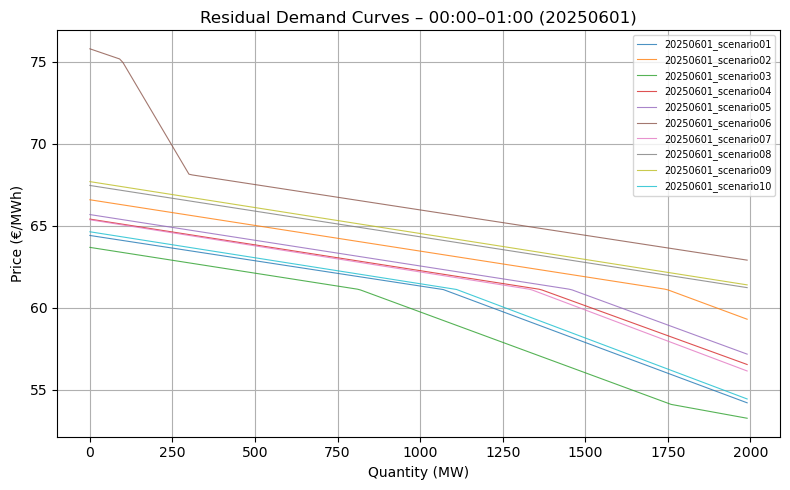

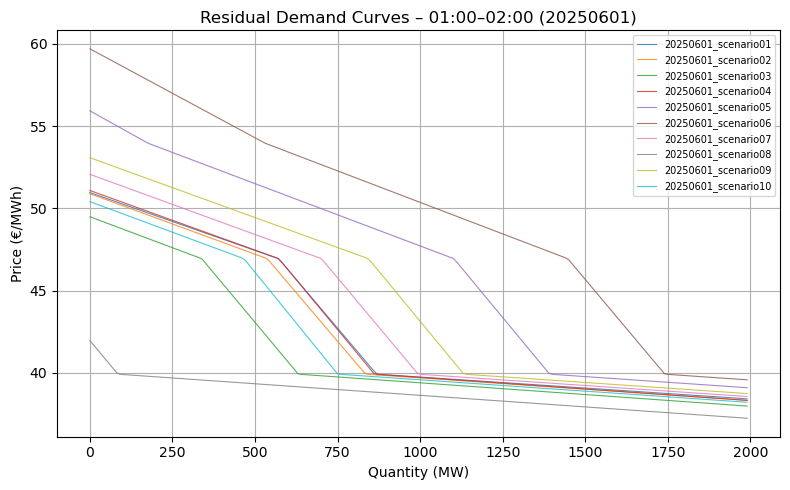

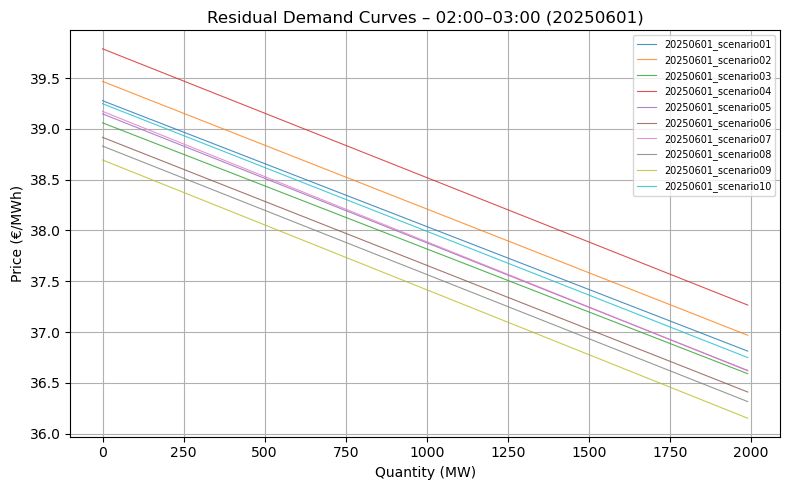

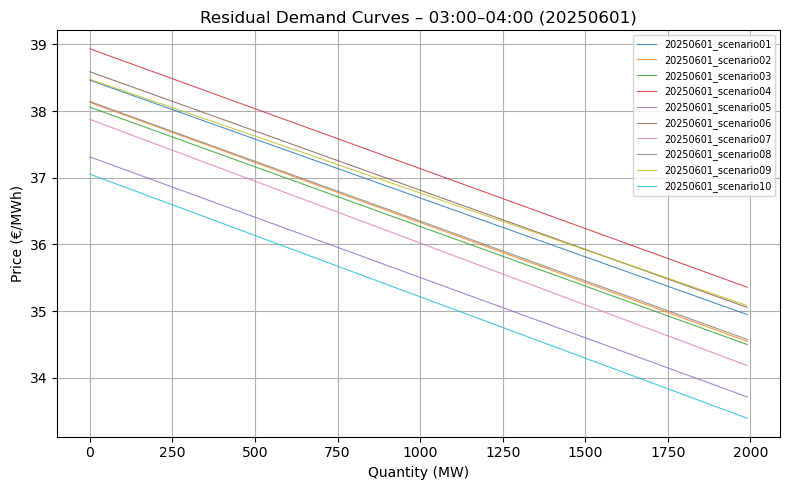

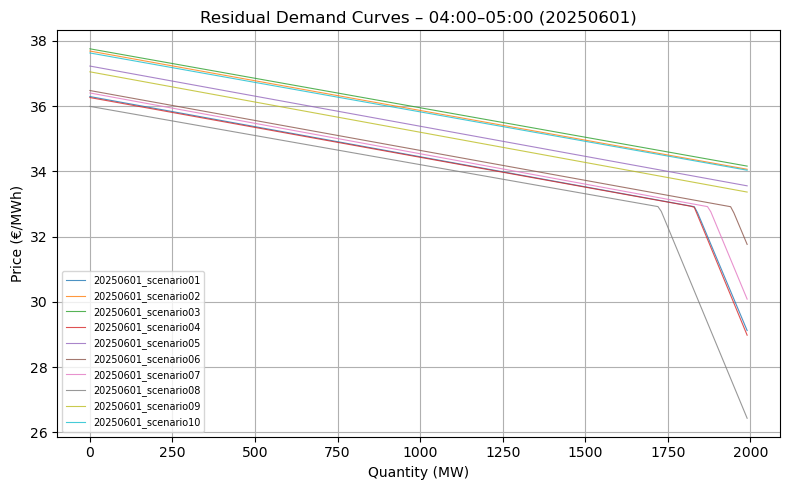

...

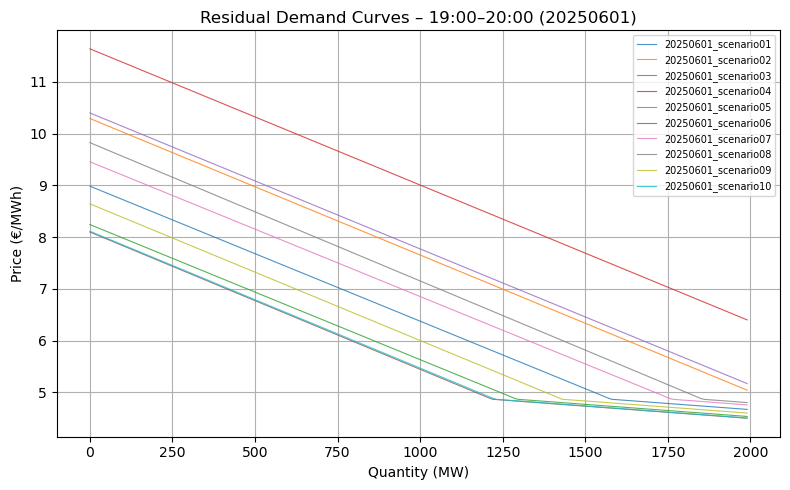

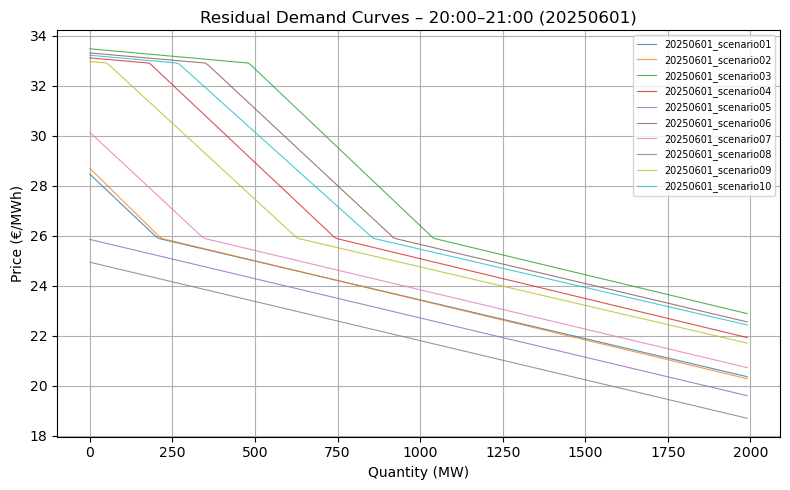

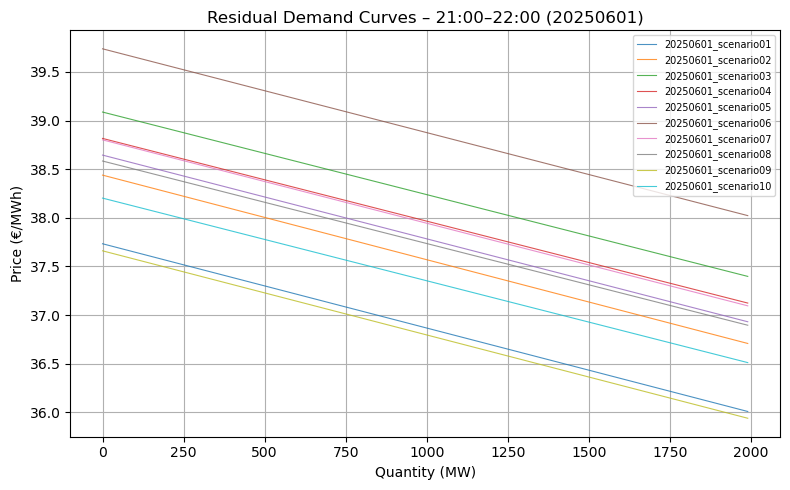

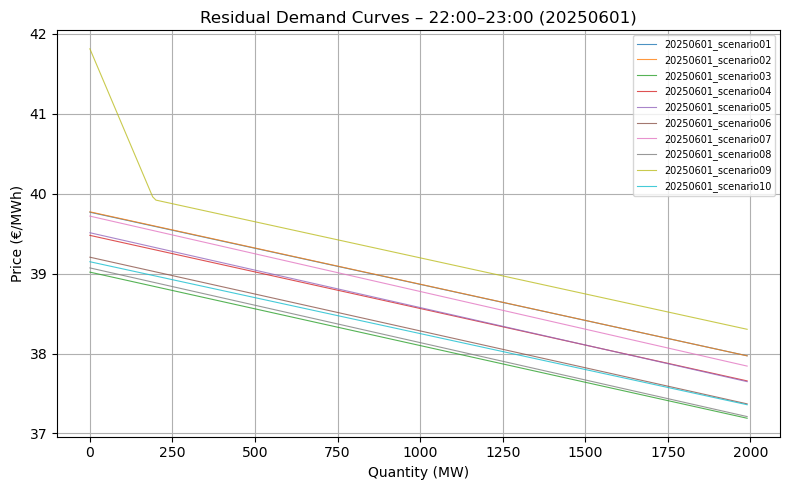

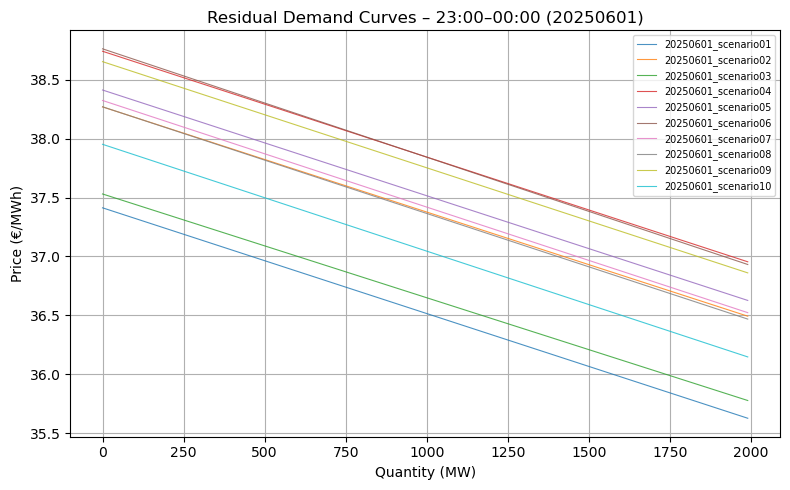

In [6]:
colors        = plt.cm.tab10(np.linspace(0,1,len(scenario_files)))

# --- 시간대별 Figure 하나씩 ---
for period in range(1,25):

    plt.figure(figsize=(8,5))

    for file, color in zip(scenario_files, colors):
        scen_name = os.path.splitext(file)[0]
        fn        = os.path.join(scenario_dir, file)
        df        = pd.read_csv(fn, encoding='utf-8-sig')

        sub = df[df['Time Period']==period]
        sup = sub[sub['GC']=='V']
        dem = sub[sub['GC']=='C']
        if sup.empty or dem.empty:
            continue

        # 공급/수요 집계
        s_agg = sup.groupby('Price')['Amount'].sum().reset_index().sort_values('Price')
        s_agg['Cumul'] = s_agg['Amount'].cumsum()

        d_agg = dem.groupby('Price')['Amount'].sum().reset_index().sort_values('Price')
        d_agg['Cumul'] = d_agg['Amount'][::-1].cumsum()[::-1]

        # 보간
        s_f = interp1d(s_agg['Price'], s_agg['Cumul'],
                       kind='previous', bounds_error=False,
                       fill_value=(0, s_agg['Cumul'].iat[-1]))
        d_f = interp1d(d_agg['Price'], d_agg['Cumul'],
                       kind='previous', bounds_error=False,
                       fill_value=(d_agg['Cumul'].iat[0], 0))

        pg = np.linspace(min(s_agg['Price'].min(), d_agg['Price'].min()),
                         max(s_agg['Price'].max(), d_agg['Price'].max()), 500)
        sv = s_f(pg); dv = d_f(pg)

        # RDC 계산
        rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
        if not rdc_pts:
            continue
        qv, pv = zip(*rdc_pts)

        # stepwise 블록 경계 만들기
        q_breaks = np.linspace(min(qv), max(qv), B+1)

        for b in range(B):
            q_low, q_high = q_breaks[b], q_breaks[b+1]
            mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
            if not mask.any():
                continue
            # 블록 내 대표값 (qini, qmax, lam_da)
            qini[(scen_name, period, b)] = q_low
            qmax[(scen_name, period, b)] = q_high - q_low
            lambda_da_block[(scen_name, period, b)] = np.mean(np.array(pv)[mask])


        # --- Plot ---
        plt.plot(qv, pv, '-', color=color, linewidth=0.8, alpha=0.8, label=scen_name)

    # 시간대별 제목
    hh1 = f"{period-1:02d}:00"; hh2 = f"{period%24:02d}:00"
    plt.title(f"Residual Demand Curves – {hh1}–{hh2} ({date_str})")

    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    plt.grid(True)
    plt.legend(fontsize=7)
    plt.tight_layout()
    plt.show()

RDC 시나리오 생성

In [7]:
# df = pd.DataFrame([
#     {
#         "scenario": scen,
#         "t": t,
#         "b": b,
#         "qini": qini[(scen,t,b)],
#         "qmax": qmax[(scen,t,b)],
#         "lam_da": lambda_da_block[(scen,t,b)]
#     }
#     for (scen,t,b) in qini.keys()
# ])

# df = df.sort_values(["scenario","t","b"]).reset_index(drop=True)

# # 저장
# df.to_csv("rdc_scenarios.csv", index=False, encoding="utf-8-sig")
# df.to_excel("rdc_scenarios.xlsx", index=False)

# print("✅ rdc_scenarios.csv / rdc_scenarios.xlsx 저장 완료!")

              scenario  t   b   qini  qmax     lam_da
0  20250601_scenario01  1   0   0.00  3.98  64.413927
1  20250601_scenario01  1   2   7.96  3.98  64.383133
2  20250601_scenario01  1   5  19.90  3.98  64.352339
3  20250601_scenario01  1   7  27.86  3.98  64.321544
4  20250601_scenario01  1  10  39.80  3.98  64.290750


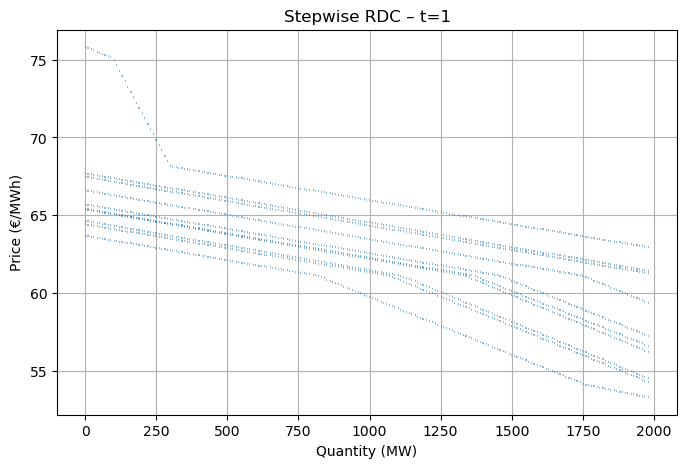

In [8]:
# 1) 저장된 CSV 불러오기
df = pd.read_csv("rdc_scenarios.csv", encoding="utf-8-sig")

print(df.head())   # 데이터 확인 (앞 5줄)

# 2) 특정 시간(t)에서 모든 시나리오 곡선 그리기
t_to_plot = 1   # 예: 2시(hour 2)

plt.figure(figsize=(8,5))

for scen in df["scenario"].unique():
    sub = df[(df["scenario"]==scen) & (df["t"]==t_to_plot)]
    if sub.empty:
        continue
    
    # qini ~ qini+qmax 까지 구간별 step plot
    q_starts = sub["qini"].values
    q_ends   = sub["qini"].values + sub["qmax"].values
    prices   = sub["lam_da"].values
    
    for qs, qe, p in zip(q_starts, q_ends, prices):
        plt.hlines(y=p, xmin=qs, xmax=qe, color="C0", alpha=0.5)
    
plt.xlabel("Quantity (MW)")
plt.ylabel("Price (€/MWh)")
plt.title(f"Stepwise RDC – t={t_to_plot}")
plt.grid(True)
plt.show()

발전량, RT 가격 시나리오 생성

In [12]:
S = list(range(10))                                     # 풍력 설비 0번만
I = list(range(1))                                     # 풍력 설비 0번만
T = list(range(1, 25))                                # 시간 1~24
J = [1,2,3,4]

In [13]:
# 15분 분할
#7월 20일 기준
rt_price_15min = [
    75.78, 75.54, 72.72, 42.23, 75.30, 75.30, 61.91, 35.25, 75.30, 48.33,
    39.81, 23.08, 65.80, 49.92, 33.81, 18.07, 45.68, 35.81, 26.04, 30.98,
    32.11, 36.47, 34.14, 29.49, 27.58, 34.34, 21.44, 33.44, 26.00,  3.30,
    -1.99, -8.99, 28.79,  0.49, -5.51, -6.31,  3.52,  0.65, -1.01, -5.90,
    -0.97, -3.00, -3.00,  0.00,  0.01,  4.31,  0.00,  0.00,  0.99,  0.99,
     0.14,  0.00,  0.65,  0.65,  0.65,  0.00,  0.99,  0.00,  0.00,  0.00,
    -0.65, -0.65, -0.50, -0.65,  0.00,  0.00,  0.00, -0.01, -0.61,  0.00,
     0.00,  0.00,  0.00,  0.00,  0.00,  0.00, -9.70, -0.97, 20.33, 79.89,
    -8.99,  8.81, 49.88, 83.87, 36.84, 66.60, 72.19, 75.54, 82.80, 82.80,
    85.21, 82.01, 86.16, 78.72, 72.27, 53.31
]
rt_price_15min = 0.5 * np.array(rt_price_15min)  # 15분 단위 RT 가격
# 1) 15분 가격을 (24시간 × 4구간) 배열로 재형성
rt15_arr = np.array(rt_price_15min).reshape(24, 4)

# (t,j) → price 사전 생성
#  t=1..24,  j=1..4
lambda_rt = {
    (t, j): float(rt15_arr[t-1, j-1])
    for t in T for j in J
}
sigma_eta = 0.1  # 실시간 가격 변동성 (5%)
# λ_rt_act[(t,j,s)] : 시나리오 s의 시간 t, 구간 j 실시간 가격
lambda_rt_act = {
    (t, j, s): rt15_arr[t-1, j-1] * (1 + sigma_eta * np.random.randn())
    for t in T for j in J for s in S
}

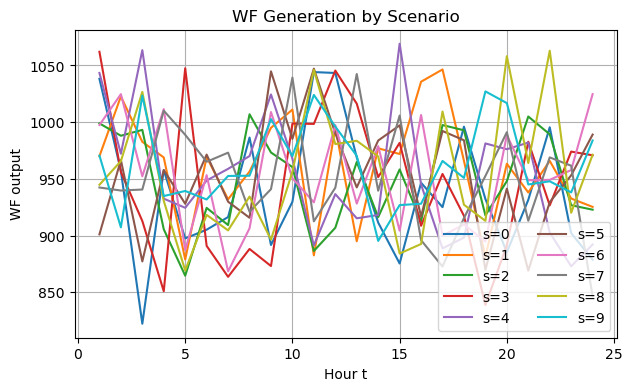

[CHECK] RT act min/max: -5.83 / 49.85,  negatives: 180개
[CHECK] WF  min/max/mean: 822.4 / 1069.2 / 952.4


In [14]:
sigma_frac = 0.05   # 5% 변동성
mu_frac    = 0.95   # 평균 95% 정격출력
Cw = 1000

np.random.seed(0)
pwf = {
    (i,t,s): max(0, np.random.normal(Cw*mu_frac, Cw*sigma_frac))
    for i in I for t in T for s in S
}

i0 = I[0]
fig4 = plt.figure(figsize=(7,4))
for s in S:
    wf_t = [pwf[(i0,t,s)] for t in T]
    plt.plot(T, wf_t, label=f"s={s}")
plt.title('WF Generation by Scenario')
plt.xlabel('Hour t')
plt.ylabel('WF output')
plt.legend(ncol=2)
plt.grid(True)
plt.show()

# --- 5) 빠른 통계/이상치 점검 ---
rt_all = np.array([lambda_rt_act[(t,j,s)] for t in T for j in J for s in S])
wf_all = np.array([pwf[(i0,t,s)] for t in T for s in S])

neg_rt = np.sum(rt_all < 0)
print(f"[CHECK] RT act min/max: {rt_all.min():.2f} / {rt_all.max():.2f},  negatives: {neg_rt}개")
print(f"[CHECK] WF  min/max/mean: {wf_all.min():.1f} / {wf_all.max():.1f} / {wf_all.mean():.1f}")


### 시나리오 튜플 생성

In [129]:
# ----------------------------
# 1) 1000개 조합의 w 인덱스 만들기
# ----------------------------
from itertools import product
triples = list(product(S, S, S))   # (rdc_s, gen_s, rt_s) 10*10*10 = 1000
W = list(range(len(triples)))      # w = 0..999
rho_w = [1/len(W)] * len(W)
# ----------------------------
# 2) (t,b,w) / (i,t,w) / (t,j,w) 빅 딕셔너리 생성
# ----------------------------
from collections import defaultdict

qini_big      = {}
qmax_big      = {}
lambda_da_big = {}
pwf_big       = {}
rt_big        = {}

# w별 유효 블록 (t,b) 집합도 함께 구축 (b가 없는 경우 KeyError 방지)
valid_blocks_by_w = defaultdict(list)   # key: (t,w) -> [b1,b2,...]

for w, (rdc_s, gen_s, rt_s) in enumerate(triples):
    # --- RDC: (t,b,rdc_s) -> (t,b,w)
    for (t,b,s) in qini_scen_final.keys():
        if s != rdc_s:
            continue
        qini_big[(t,b,w)]      = qini_scen_final[(t,b,s)]
        qmax_big[(t,b,w)]      = qmax_scen_final[(t,b,s)]
        lambda_da_big[(t,b,w)] = lambda_da_scen_final[(t,b,s)]
        # qmax>0인 블록만 유효 블록에 추가 (원래 valid_blocks[t]와 일치하게)
        if qmax_big[(t,b,w)] > 0:
            valid_blocks_by_w[(t,w)].append(b)

    # --- WF: (i,t,gen_s) -> (i,t,w)
    for (i,t,s) in pwf.keys():
        if s != gen_s:
            continue
        pwf_big[(i,t,w)] = pwf[(i,t,s)]

    # --- RT: (t,j,rt_s) -> (t,j,w)
    for (t,j,s) in lambda_rt_act.keys():
        if s != rt_s:
            continue
        rt_big[(t,j,w)] = lambda_rt_act[(t,j,s)]

# 중복 제거 및 정렬
for (t,w), bs in list(valid_blocks_by_w.items()):
    valid_blocks_by_w[(t,w)] = sorted(set(bs))

print("W 개수:", len(W))                      # 1000
print("예시 lambda_da_big key:", next(iter(lambda_da_big)))
print("예시 rt_big key:", next(iter(rt_big)))


W 개수: 1000
예시 lambda_da_big key: (1, 0, 0)
예시 rt_big key: (1, 1, 0)


In [73]:
rt_big = {}
for w, (_, _, rt_sub) in enumerate(combined_scenarios):
    for (t,j), val in rt_sub.items():
        rt_big[(t,j,w)] = val


In [50]:
# 1) CSV 불러오기
df = pd.read_csv("rdc_scenarios.csv", encoding="utf-8-sig")

# 2) 날짜 / 시나리오 / 시간 정의
date_range = df["scenario"].unique().tolist()
S = list(range(len(date_range)))     # 시나리오 index: 0,1,...
T = list(range(1, 25))               # 시간
I = [0]
J = [1,2,3,4]
Δt = 0.25
rho = {s: 1/len(S) for s in S}

# 시나리오 ID 문자열 → 숫자 매핑
s_map = {date: idx for idx, date in enumerate(date_range)}

# 3) 시나리오 맵 생성 (최종)
qini_scen_final      = {}
qmax_scen_final      = {}
lambda_da_scen_final = {}
valid_blocks         = {t: [] for t in T}

for (s,t), sub in df.groupby(["scenario","t"]):
    sub_sorted = sub.sort_values("qini").reset_index(drop=True)
    for b, r in sub_sorted.iterrows():
        s_idx = s_map[s]   # 문자열 시나리오 → 숫자 index
        qini_scen_final[(t,b,s_idx)]      = float(r["qini"])
        qmax_scen_final[(t,b,s_idx)]      = float(r["qmax"])
        lambda_da_scen_final[(t,b,s_idx)] = float(r["lam_da"])
        if r["qmax"] > 0:
            valid_blocks[t].append(b)

# 중복 제거
valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}

print("예시 qini_scen_final keys:", list(qini_scen_final.keys())[:10])
print("예시 valid_blocks[1]:", valid_blocks[1])


예시 qini_scen_final keys: [(1, 0, 0), (1, 1, 0), (1, 2, 0), (1, 3, 0), (1, 4, 0), (1, 5, 0), (1, 6, 0), (1, 7, 0), (1, 8, 0), (1, 9, 0)]
예시 valid_blocks[1]: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190

In [80]:
print(len(lambda_da_big), len(pwf_big), len(rt_big))

4776000 24000 96000


In [58]:
# 시나리오 ID → index 매핑
unique_scenarios = df["scenario"].unique()
scenario_to_w = {s:i for i,s in enumerate(unique_scenarios)}
W = list(range(len(unique_scenarios)))

# 새 dict
qini_scen_final = {}
qmax_scen_final = {}
lambda_da_scen_final = {}

valid_blocks = {t: [] for t in T}

for (s,t), sub in df.groupby(["scenario","t"]):
    w = scenario_to_w[s]   # 문자열 ID → 정수 index 변환
    sub_sorted = sub.sort_values("qini").reset_index(drop=True)
    for b, r in sub_sorted.iterrows():
        qini_scen_final[(t,b,w)] = float(r["qini"])
        qmax_scen_final[(t,b,w)] = float(r["qmax"])
        lambda_da_scen_final[(t,b,w)] = float(r["lam_da"])
        if r["qmax"] > 0:
            valid_blocks[t].append(b)

valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}


In [59]:
combined_scenarios = []

for rdc_s, gen_s, rt_s in itertools.product(S, S, S):
    # RDC dict
    rdc_sub = {
        (t,b): (
            qini_scen_final[(t,b,rdc_s)],
            qmax_scen_final[(t,b,rdc_s)],
            lambda_da_scen_final[(t,b,rdc_s)]
        )
        for (t,b,s) in qini_scen_final if s == rdc_s
    }

    # 발전량 dict
    pwf_sub = {
        (i,t): pwf[(i,t,gen_s)]
        for (i,t,s) in pwf if s == gen_s
    }

    # RT 가격 dict
    rt_sub = {
        (t,j): lambda_rt_act[(t,j,rt_s)]
        for (t,j,s) in lambda_rt_act if s == rt_s
    }

    combined_scenarios.append((rdc_sub, pwf_sub, rt_sub))

W = list(range(len(combined_scenarios)))


In [52]:
# # 1) CSV 불러오기
# df = pd.read_csv("rdc_scenarios.csv", encoding="utf-8-sig")

# # ────────────────────────────────
# # 2) 날짜 / 시나리오 / 시간 정의
# date_range = [f"202507{d:02d}" for d in range(20, 30)]  # 20,21,…,29
# S = list(range(len(date_range)))                        # 시나리오 0~9
# T = list(range(1, 25))                                  # 시간 1~24
# I = [0]                                                 # 풍력 설비 0번만
# J = [1,2,3,4]                                           # 15분 분할
# Δt = 0.25

# # 시나리오 확률 (균등)
# rho = {s: 1/len(S) for s in S}

# # ────────────────────────────────
# # 3) 시나리오 맵 생성

# qini_scen      = {}
# qmax_scen      = {}
# lambda_da_scen = {}

# for _, row in df.iterrows():
#     s   = str(row["scenario"])      # 시나리오 ID (예: "20250601_")
#     t   = int(row["t"])             # 시간 (1~24)
#     b   = int(row["b"])             # 블록 index
#     qini_val   = float(row["qini"])        # qini
#     max_val   = float(row["qmax"])        # qmax
#     lam_val   = float(row["lam_da"])      # lambda_da

#     qini_scen[(t,b,s)]      = qini_val
#     qmax_scen[(t,b,s)]      = max_val
#     lambda_da_scen[(t,b,s)] = lam_val
# # # CSV에는 "scenario", "t", "qini", "qmax", "lam_da"가 있다고 가정
# # for _, row in df.iterrows():
# #     s = str(row["scenario"])   # 문자열 그대로
# #     t = int(row["t"])
# #     qini_val = float(row["qini"])
# #     qmax_val = float(row["qmax"])
# #     lam_val  = float(row["lam_da"])

# #     qini_scen[(s,t,qini_val)]      = qini_val
# #     qmax_scen[(s,t,qini_val)]      = qmax_val
# #     lambda_da_scen[(s,t,qini_val)] = lam_val

# # for _, row in df.iterrows():
# #     s = int(row["scenario"])
# #     t = int(row["t"])
# #     qini_val = float(row["qini"])
# #     qmax_val = float(row["qmax"])
# #     lam_val  = float(row["lam_da"])
    
# #     # block index b는 enumerate로 부여 (같은 t 안에서 0,1,2,...)
# #     # CSV에 block 정보가 없다고 가정 → qini 기준으로 sort 후 생성
# #     # 우선 t,s별 그룹핑
# #     # 나중에 valid_blocks 만들 때 Δ>0인 b만 남길 것임
    
# #     # 임시로 key를 (s,t,qini)로 저장해두고 나중에 b index 매핑
# #     qini_scen[(s,t,qini_val)] = qini_val
# #     qmax_scen[(s,t,qini_val)] = qmax_val
# #     lambda_da_scen[(s,t,qini_val)] = lam_val

# # ────────────────────────────────
# # 4) block index 부여
# qini_scen_final       = {}
# qmax_scen_final       = {}
# lambda_da_scen_final  = {}

# valid_blocks = {t: [] for t in T}

# for (s,t), sub in df.groupby(["scenario","t"]):
#     # qini 기준 정렬
#     sub_sorted = sub.sort_values("qini").reset_index(drop=True)
#     for b, r in sub_sorted.iterrows():
#         qini_scen_final[(t,b,s)] = float(r["qini"])
#         qmax_scen_final[(t,b,s)] = float(r["qmax"])
#         lambda_da_scen_final[(t,b,s)] = float(r["lam_da"])
#         if r["qmax"] > 0:
#             valid_blocks[t].append(b)

# # 중복 제거 및 정렬
# valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}

# # ────────────────────────────────
# # 최종 결과 확인
# print("rho:", rho)
# print("예시 qini_scen_final keys:", list(qini_scen_final.keys())[:10])
# print("예시 valid_blocks:", {t: valid_blocks[t] for t in range(1,4)})


In [16]:
# # 10개 만들기
# group_size = 10
# scenario_groups = [S[i:i+group_size] for i in range(0, len(S), group_size)]

# combined_scenarios = []

# for group in scenario_groups:
#     # RDC 묶기: (qini, qmax, lambda_da)
#     rdc_sub = {
#         (t,b,s): (
#             qini_scen[(t,b,s)],
#             qmax_scen[(t,b,s)],
#             lambda_da_scen[(t,b,s)]
#         )
#         for (t,b,s) in qini_scen if s in group
#     }
    
#     # Generation
#     pwf_sub = {
#         (i,t,s): pwf[(i,t,s)]
#         for (i,t,s) in pwf if s in group
#     }
    
#     # RT Price
#     rt_sub = {
#         (t,j,s): lambda_rt_act[(t,j,s)]
#         for (t,j,s) in lambda_rt_act if s in group
#     }
    
#     combined_scenarios.append((rdc_sub, pwf_sub, rt_sub))

# # ────────────────────────────────
# # 결과 확인
# print(f"총 {len(combined_scenarios)} 개의 묶음 생성")
# print("첫 번째 묶음 예시:")
# rdc_sub, pwf_sub, rt_sub = combined_scenarios[0]
# print("RDC sample:", list(rdc_sub.items())[:3])
# print("PWF sample:", list(pwf_sub.items())[:3])
# print("RT sample :", list(rt_sub.items())[:3])

In [53]:
# # 10개씩 샘플링 (예: 시나리오 번호 기준)
# rdc_group = list({s for (s,t,b) in qini_scen})[:10]   # 실제 시나리오 ID 문자열 10개
# gen_group = list({s for (i,t,s) in pwf})[:10]
# rt_group  = list({s for (t,j,s) in lambda_rt_act})[:10]


# combined_scenarios = []

# for rdc_s, gen_s, rt_s in itertools.product(rdc_group, gen_group, rt_group):
#     # RDC dict (해당 시나리오만 추출)
#     rdc_sub = {
#         (t, b_idx): (
#             qini_scen[(s,t,b)],
#             qmax_scen[(s,t,b)],
#             lambda_da_scen[(s,t,b)]
#         )
#         for (s,t,b) in qini_scen if s == rdc_s
#         for b_idx, _ in enumerate([b])   # block 인덱스 강제
#     }
#     # 발전량
#     pwf_sub = {
#         (i,t): pwf[(i,t,s)]
#         for (i,t,s) in pwf if s == gen_s
#     }
    
#     # RT 가격
#     rt_sub = {
#         (t,j): lambda_rt_act[(t,j,s)]
#         for (t,j,s) in lambda_rt_act if s == rt_s
#     }
    
#     combined_scenarios.append((rdc_sub, pwf_sub, rt_sub))

# W = list(range(len(combined_scenarios)))

In [60]:
for tup in combined_scenarios[:10]:
    print(tup)

({(1, 0): (0.0, 3.98, 64.41392693527469), (1, 1): (7.96, 3.98, 64.38313272149419), (1, 2): (19.9, 3.98, 64.3523385077137), (1, 3): (27.86, 3.98, 64.3215442939332), (1, 4): (39.8, 3.980000000000004, 64.29075008015269), (1, 5): (47.76, 3.980000000000004, 64.2599558663722), (1, 6): (59.7, 3.979999999999997, 64.2291616525917), (1, 7): (67.66, 3.980000000000004, 64.1983674388112), (1, 8): (79.6, 3.980000000000004, 64.16757322503071), (1, 9): (87.56, 3.980000000000004, 64.1367790112502), (1, 10): (99.5, 3.980000000000004, 64.1059847974697), (1, 11): (107.46, 3.980000000000004, 64.0751905836892), (1, 12): (119.4, 3.9799999999999898, 64.04439636990871), (1, 13): (127.36, 3.980000000000004, 64.0136021561282), (1, 14): (139.3, 3.9799999999999898, 63.982807942347705), (1, 15): (147.26, 3.980000000000018, 63.95201372856721), (1, 16): (159.2, 3.980000000000018, 63.92121951478671), (1, 17): (167.16, 3.9799999999999898, 63.89042530100621), (1, 18): (179.1, 3.980000000000018, 63.85963108722572), (1, 1

In [55]:
print("샘플 rdc_sub keys:", list(combined_scenarios[0][0].keys())[:10])
print("샘플 pwf_sub keys:", list(combined_scenarios[0][1].keys())[:10])
print("샘플 rt_sub keys :", list(combined_scenarios[0][2].keys())[:10])


샘플 rdc_sub keys: [(1, 0), (1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9)]
샘플 pwf_sub keys: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10)]
샘플 rt_sub keys : [(1, 1), (1, 2), (1, 3), (1, 4), (2, 1), (2, 2), (2, 3), (2, 4), (3, 1), (3, 2)]


In [62]:
print("len(W):", len(W))
print("max key in lambda_da_scen_final:", max(w for (_,_,w) in lambda_da_scen_final.keys()))


len(W): 1000
max key in lambda_da_scen_final: 9


In [44]:
# 최종 big dict 만들기
qini_big      = {}
qmax_big      = {}
lambda_da_big = {}
pwf_big       = {}
rt_big        = {}

for w, (rdc_sub, pwf_sub, rt_sub) in enumerate(combined_scenarios):
    # RDC
    for (t,b), (qini_val, qmax_val, lam_val) in rdc_sub.items():
        qini_big[(t,b,w)]      = qini_val
        qmax_big[(t,b,w)]      = qmax_val
        lambda_da_big[(t,b,w)] = lam_val
    
    # 발전량
    for (i,t), pwf_val in pwf_sub.items():
        pwf_big[(i,t,w)] = pwf_val
    
    # RT 가격
    for (t,j), rt_val in rt_sub.items():
        rt_big[(t,j,w)] = rt_val

In [63]:
lambda_da_big = {}
qini_big = {}
qmax_big = {}

for w, (rdc_sub, _, _) in enumerate(combined_scenarios):
    for (t,b), (qini_val, qmax_val, lam_val) in rdc_sub.items():
        lambda_da_big[(t,b,w)] = lam_val
        qini_big[(t,b,w)] = qini_val
        qmax_big[(t,b,w)] = qmax_val


In [47]:
print("lambda_da_big sample:", list(lambda_da_big.keys())[:10])
print("qini_big sample:", list(qini_big.keys())[:10])
print("rt_big sample:", list(rt_big.keys())[:10])
print("valid_blocks[1]:", valid_blocks[1])


lambda_da_big sample: [(1, 0, 0), (2, 0, 0), (3, 0, 0), (4, 0, 0), (5, 0, 0), (6, 0, 0), (7, 0, 0), (8, 0, 0), (9, 0, 0), (10, 0, 0)]
qini_big sample: [(1, 0, 0), (2, 0, 0), (3, 0, 0), (4, 0, 0), (5, 0, 0), (6, 0, 0), (7, 0, 0), (8, 0, 0), (9, 0, 0), (10, 0, 0)]
rt_big sample: [(1, 1, 0), (1, 2, 0), (1, 3, 0), (1, 4, 0), (2, 1, 0), (2, 2, 0), (2, 3, 0), (2, 4, 0), (3, 1, 0), (3, 2, 0)]
valid_blocks[1]: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140

## 최적화모델

In [25]:
eta_c, eta_d    = 0.9, 0.9
E0, E_min, E_max = 1400, 500, 2250
pc_max, pd_max  = 500, 500
Δt = 0.25

In [88]:
model = gp.Model("WF_ESS_3D_RDC_RT_WF")

# ---------- 1단계(H&N) ----------
u = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                  vtype=GRB.BINARY, name="u")

# qvar, p_bid도 w에 종속(DA 기대값을 w로 평균)
qvar  = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                      lb=0.0, name="qvar")
p_bid = model.addVars(T, lb=0.0, name="p_bid")

# ESS on/off (H&N)
u_c = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
u_d = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

# ---------- 2단계(Recourse; w별) ----------
p_c = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
p_d = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
E_q = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
p_b = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

# LDR 계수(공통)
p_hat_c = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
p_hat_d = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
D_c     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
D_d     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

# ---------- 목적함수 ----------
# DA 수익
DA_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        lambda_da_big[(t,b,w)] * (u[t,b] * qini_big[(t,b,w)] + qvar[t,b])
        for b in valid_blocks_by_w.get((t,w), [])
        if (t,b,w) in lambda_da_big
    )
    for w in W for t in T
)

# RT 수익
RT_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b[t,j,w] - p_bid[t]/4.0)
        for j in J if (t,j,w) in rt_big
    )
    for w in W for t in T
)

model.setObjective(DA_rev + RT_rev, GRB.MAXIMIZE)


In [90]:
# # 1) W, T, J 중 첫 1개만 테스트
# for w in W:
#     for t in T:
#         for j in J:
#             print("체크 (t,j,w):", (t,j,w))
#             print("rt_big key?", (t,j,w) in rt_big)
#             print("rho_w[w]:", rho_w[w])
#             print("p_b key?", (t,j,w) in p_b)
#             print("p_bid key?", t in p_bid)
#             print("---")


In [98]:
# ---------- 제약식 (통일 버전) ----------
# 모든 (t,j,w)에 대해 균형
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_b[(t,j,w)] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)   # 15분 평균 풍력
                + p_d[(t,j,w)] - p_c[(t,j,w)]                    # ESS 순발전
                - p_bid[t]/4.0,                                  # DA 약속의 1/4
                name=f"rt_balance_{t}_{j}_w{w}"
            )
# (6c) 매 시각 블록 하나 선택 (1단계 공통)
for t in T:
    model.addConstr(gp.quicksum(u[t,b] for b in valid_blocks[t]) == 1,
                    name=f"one_block_{t}")

# (6d) qvar ≤ qmax * u  (모든 w에서 성립 → qmax_big[(t,b,w)] 사용, qvar은 w-비의존)
for w in W:
    for t in T:
        for b in valid_blocks[t]:
            model.addConstr(
                qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
                name=f"qvar_max_{t}_{b}_w{w}"
            )

# (6e) p_bid 정의 (1단계 공통결정, 기대값 기반)
#  E[qini] = Σ_w rho_w[w] * qini_big[(t,b,w)]
mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W)
           for t in T for b in valid_blocks[t]}

for t in T:
    model.addConstr(
        p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
                                for b in valid_blocks[t]),
        name=f"p_bid_def_{t}"
    )

# (6h, 6i) LDR (2단계, w-의존)  —— delta_rt 대신 실시간가격 rt_big 사용
#     p_c = u_c * (p̂_c + D_c * λ_rt),   p_d = u_d * (p̂_d + D_d * λ_rt)
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_c[(t,j,w)] == u_c[(t,j)] * (p_hat_c[(t,j)] + D_c[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pc_{t}_{j}_w{w}"
            )
            model.addConstr(
                p_d[(t,j,w)] == u_d[(t,j)] * (p_hat_d[(t,j)] + D_d[(t,j)] * rt_big[(t,j,w)]),
                name=f"LDR_pd_{t}_{j}_w{w}"
            )

# (6k) 동시 충방전 금지 + Big-M
for t in T:
    for j in J:
        model.addConstr(u_c[(t,j)] + u_d[(t,j)] <= 1, name=f"no_simul_{t}_{j}")
        for w in W:
            model.addConstr(p_c[(t,j,w)] <= pc_max * u_c[(t,j)],
                            name=f"pc_bigm_{t}_{j}_w{w}")
            model.addConstr(p_d[(t,j,w)] <= pd_max * u_d[(t,j)],
                            name=f"pd_bigm_{t}_{j}_w{w}")

# (6j) SOC 전이 (2단계, w-의존)
for w in W:
    for t in T:
        for j in J:
            prev = (E0 if (t == 1 and j == 1)
                    else (E_q[(t-1,4,w)] if j == 1 else E_q[(t,j-1,w)]))
            model.addConstr(
                E_q[(t,j,w)] == prev + Δt*(eta_c*p_c[(t,j,w)] - p_d[(t,j,w)]/eta_d),
                name=f"SOC_{t}_{j}_w{w}"
            )

# (6g) DA vs RT 약속량 경계 (1단계 p_bid[t] vs 2단계 실현치)
#  풍력(gen) 시나리오 인덱스는 triplet_of[w][1] 이나,
#  이미 pwf_big[(i,t,w)] 로 매핑되어 있으니 그걸 그대로 사용
for w in W:
    for t in T:
        # 상한: 풍력 발전 + 방전
        rhs = 1100 + gp.quicksum(p_d[(t,j,w)] for j in J)
        # 하한: -충전
        model.addConstr(-gp.quicksum(p_c[(t,j,w)] for j in J) <= p_bid[t],
                        name=f"bid_low_{t}_w{w}")
        # 상한
        model.addConstr(p_bid[t] <= rhs, name=f"bid_up_sync_{t}_w{w}")

# 옵션 파라미터
model.Params.MIPGap = 0.02
model.Params.TimeLimit = 3600
model.Params.Heuristics = 0.1
# model.feasRelaxS(0, True, False, True)
model.optimize()


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 11+.0 (26100.2))

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 29831796 rows, 15033635 columns and 90741444 nonzeros
Model fingerprint: 0x6c5e2d63
Model has 960000 quadratic constraints
Variable types: 15028667 continuous, 4968 integer (4968 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [4e-03, 5e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [4e-06, 1e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]

Processing user MIP start: 0 nodes explored in subMIP, total elapsed time 7s
Processing user MIP start: 0 nodes explored in subMIP, total elapsed time 13s
User MIP start did not produce a new incumbent solution
User MIP start violates constraint rt_balance_1_1_w0 by 499.550654325
Processing MIP start from previous s

In [97]:
def worst_violations():
    worst = []
    for w in W:
        for t in T:
            # (6g) 하한/상한 위반량(음수면 위반)
            low_margin = p_bid[t].X + sum(p_c[(t,j,w)].X for j in J)        # >= 0 이어야
            up_margin  = (1100
                         + sum(p_d[(t,j,w)].X for j in J)) - p_bid[t].X     # >= 0 이어야
            worst.append((low_margin, up_margin, t, w))
    # 가장 위반 큰(가장 음수) 케이스 5개
    worst_low  = sorted(worst, key=lambda x: x[0])[:5]
    worst_up   = sorted(worst, key=lambda x: x[1])[:5]
    print("[하한 위반 TOP5] (margin, t, w):", [(m,t,w) for m,_,t,w in worst_low])
    print("[상한 위반 TOP5] (margin, t, w):", [(m,t,w) for _,m,t,w in worst_up])

worst_violations()


[하한 위반 TOP5] (margin, t, w): [(0.0, 1, 0), (0.0, 2, 0), (0.0, 3, 0), (0.0, 4, 0), (0.0, 5, 0)]
[상한 위반 TOP5] (margin, t, w): [(1100.0, 3, 0), (1100.0, 4, 0), (1100.0, 5, 0), (1100.0, 6, 0), (1100.0, 7, 0)]


In [99]:
# 선택된 블록
chosen_b = {t: max(valid_blocks[t], key=lambda b: u[t,b].X) for t in T}

# DA 입찰
p_bid_sol = {t: p_bid[t].X for t in T}

# ESS 제어 (시나리오 평균/첫 시나리오 예시)
p_c_mean = {(t,j): sum(rho_w[w]*p_c[t,j,w].X for w in W) for t in T for j in J}
p_d_mean = {(t,j): sum(rho_w[w]*p_d[t,j,w].X for w in W) for t in T for j in J}
E_mean   = {(t,j): sum(rho_w[w]*E_q[t,j,w].X for w in W) for t in T for j in J}


In [100]:
def check_max_violation():
    # SOC, no-simultaneous, qvar<=qmax*u, 기대값 경계
    v = []

    # no simultaneous
    for t in T:
        for j in J:
            v.append(u_c[t,j].X + u_d[t,j].X - 1.0)

    # qvar <= qmax*u  (최악 w)
    for t in T:
        for b in valid_blocks[t]:
            worst = max(qvar[t,b].X - qmax_big[(t,b,w)]*u[t,b].X for w in W)
            v.append(worst)

    # 기대값 경계 (옵션A로 바꿨다면)
    for t in T:
        lhs_low = sum(rho_w[w]*(-sum(p_c[t,j,w].X for j in J)) for w in W)
        rhs_up  = sum(rho_w[w]*(sum(pwf_big[(i,t,w)] for i in I) + sum(p_d[t,j,w].X for j in J)) for w in W)
        v.append(lhs_low - p_bid[t].X)
        v.append(p_bid[t].X - rhs_up)

    print("max violation:", max(v, default=0.0))

check_max_violation()


max violation: 0.0


In [102]:
import csv
with open("solution_da_rt.csv","w",newline="",encoding="utf-8-sig") as f:
    wtr = csv.writer(f)
    wtr.writerow(["t","chosen_b","p_bid","p_c_mean","p_d_mean","E_mean"])
    for t in T:
        for j in J:
            wtr.writerow([t, chosen_b[t], p_bid_sol[t], p_c_mean[t,j], p_d_mean[t,j], E_mean[t,j]])
print("saved: solution_da_rt09161505.csv")


saved: solution_da_rt09161505.csv


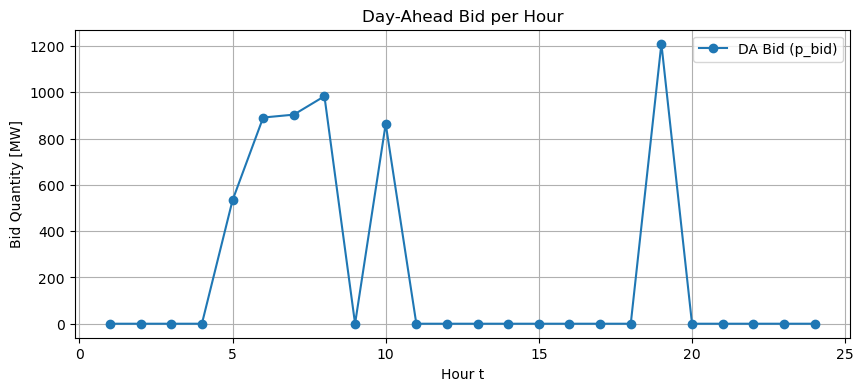

In [103]:
plt.figure(figsize=(10,4))
plt.plot(list(T), [p_bid_sol[t] for t in T], marker="o", label="DA Bid (p_bid)")
plt.xlabel("Hour t")
plt.ylabel("Bid Quantity [MW]")
plt.title("Day-Ahead Bid per Hour")
plt.grid(True)
plt.legend()
plt.show()

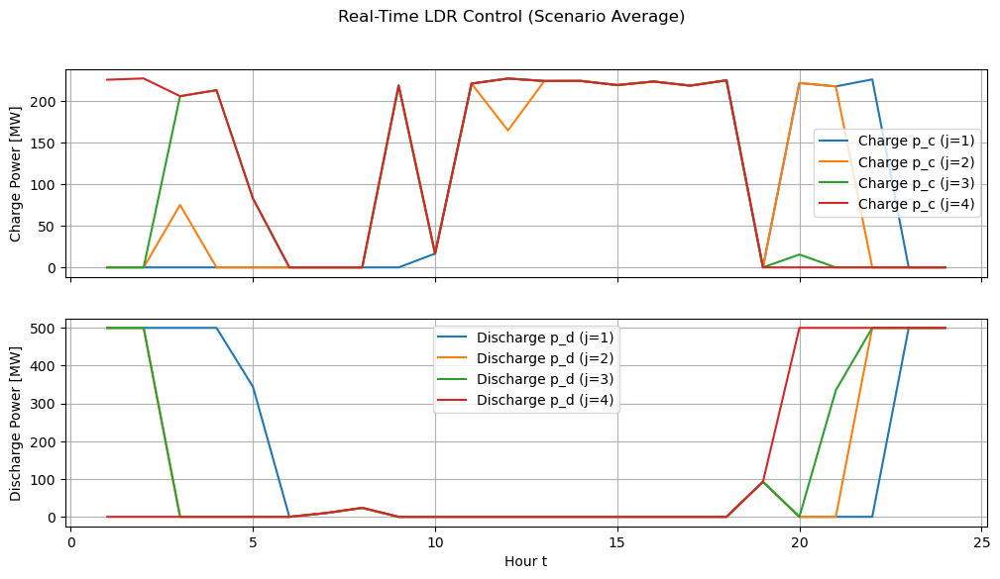

In [104]:
fig, ax = plt.subplots(2,1, figsize=(12,6), sharex=True)

# 충전
for j in J:
    ax[0].plot(list(T), [p_c_mean[t,j] for t in T], label=f"Charge p_c (j={j})")
ax[0].set_ylabel("Charge Power [MW]")
ax[0].legend()
ax[0].grid(True)

# 방전
for j in J:
    ax[1].plot(list(T), [p_d_mean[t,j] for t in T], label=f"Discharge p_d (j={j})")
ax[1].set_xlabel("Hour t")
ax[1].set_ylabel("Discharge Power [MW]")
ax[1].legend()
ax[1].grid(True)

plt.suptitle("Real-Time LDR Control (Scenario Average)")
plt.show()


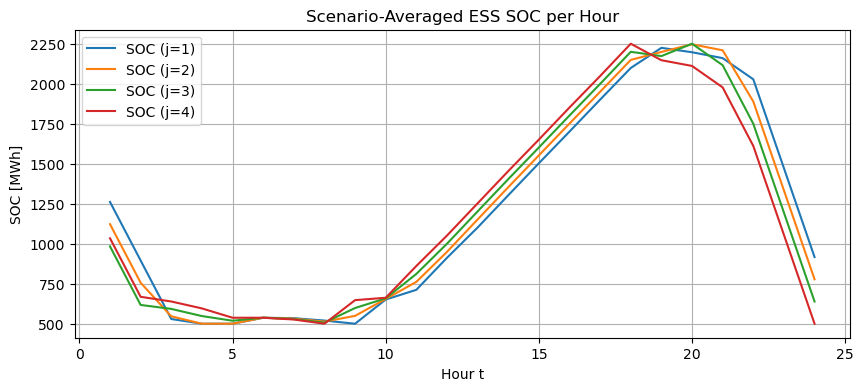

In [105]:
plt.figure(figsize=(10,4))
for j in J:
    plt.plot(list(T), [E_mean[t,j] for t in T], label=f"SOC (j={j})")
plt.xlabel("Hour t")
plt.ylabel("SOC [MWh]")
plt.title("Scenario-Averaged ESS SOC per Hour")
plt.legend()
plt.grid(True)
plt.show()


### 최적화: deterministic rdc

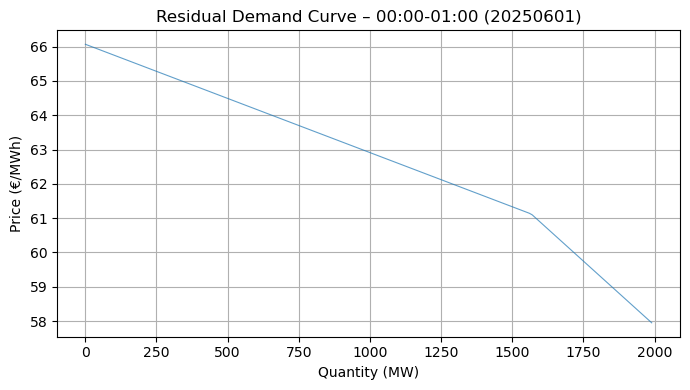

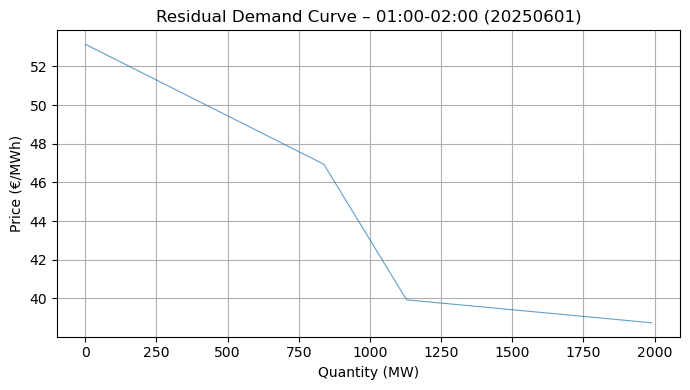

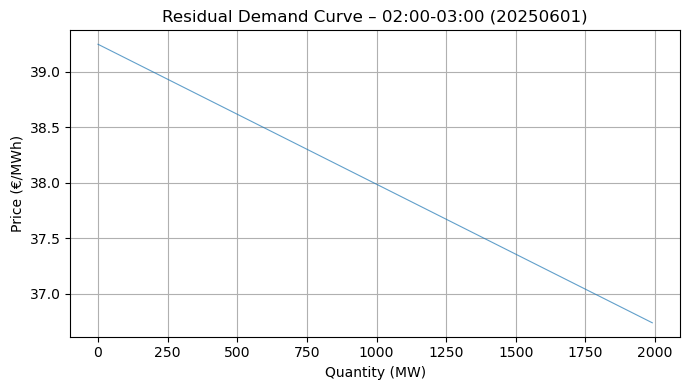

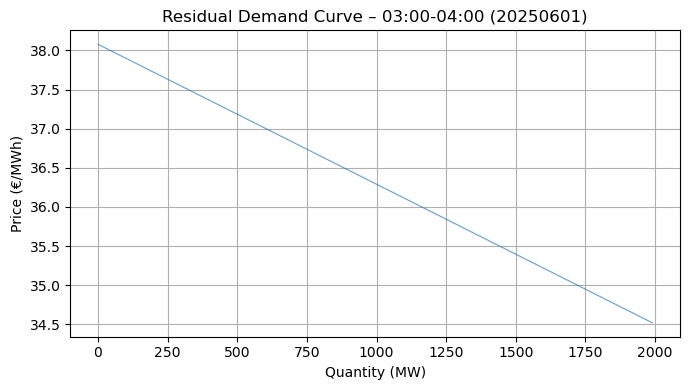

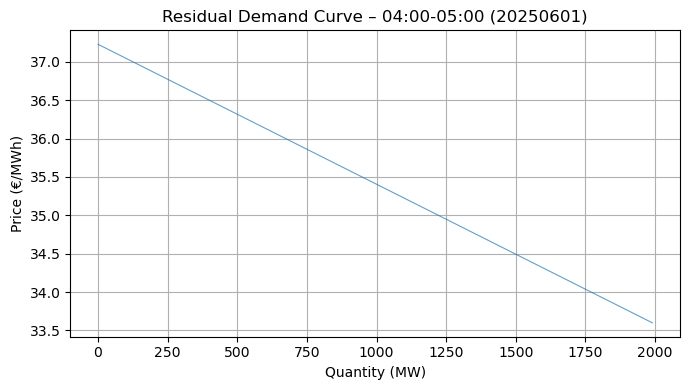

...

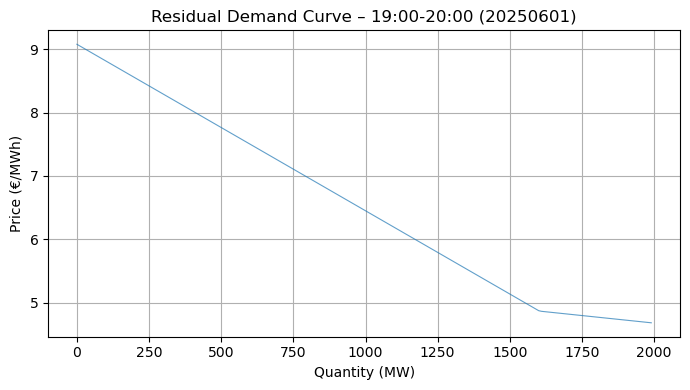

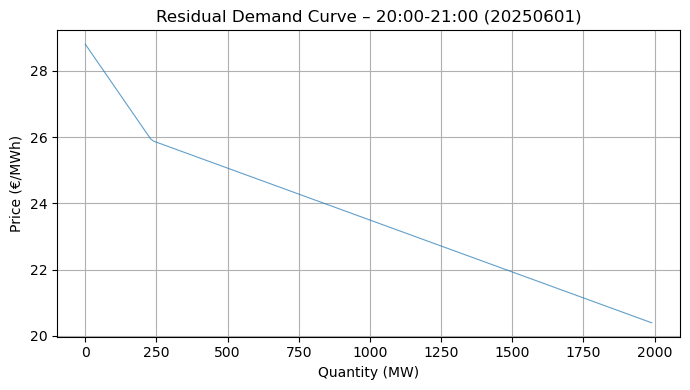

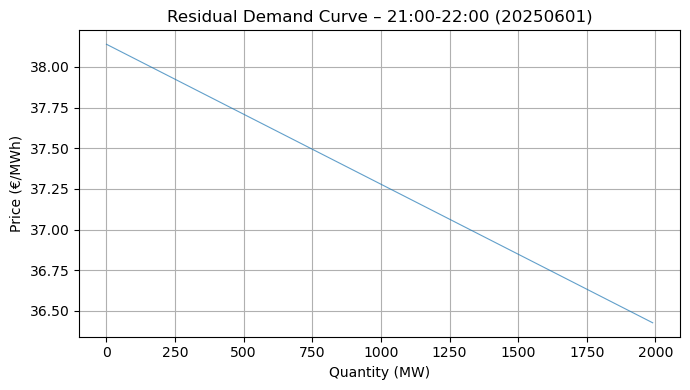

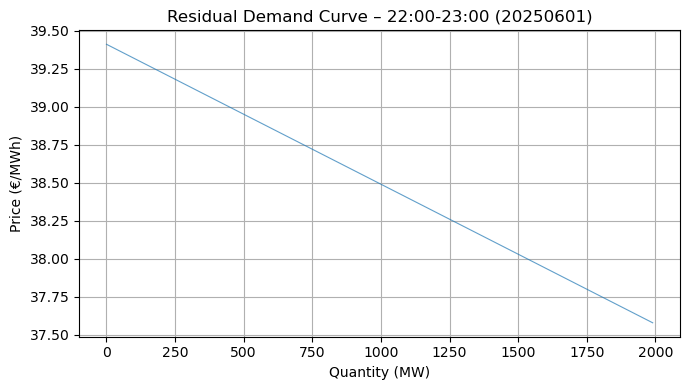

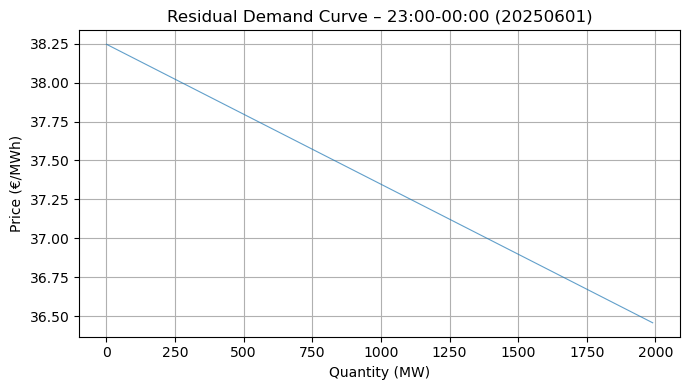

예시 qini: [(('20250601', 1, 0), 0.0), (('20250601', 1, 2), 7.96), (('20250601', 1, 5), 19.9), (('20250601', 1, 7), 27.86), (('20250601', 1, 10), 39.8)]
예시 lambda_da_block: [(('20250601', 1, 0), 66.07005375389937), (('20250601', 1, 2), 66.03847468021465), (('20250601', 1, 5), 66.00689560652994), (('20250601', 1, 7), 65.97531653284523), (('20250601', 1, 10), 65.9437374591605)]


In [107]:
# --- 공통 설정 ---
date_str = "20250601"
file_in  = f"filteredcurve_{date_str}.csv"

wf_offer_grid = np.arange(0, 2000, 10)  # 풍력 오퍼량 grid
B             = 500                     # stepwise block 개수

# stepwise 파라미터 저장 dict
qini            = {}
qmax            = {}
lambda_da_block = {}

# --------------------------
# 24시간(Period 1~24) 반복
# --------------------------
for period in range(1,25):
    df = pd.read_csv(file_in, encoding="utf-8-sig")
    sub = df[df['Time Period']==period]
    sup = sub[sub['GC']=='V']
    dem = sub[sub['GC']=='C']
    if sup.empty or dem.empty:
        print(f"{date_str} Period {period}: 데이터 없음")
        continue

    # 공급/수요 집계
    s_agg = sup.groupby('Price')['Amount'].sum().reset_index().sort_values('Price')
    s_agg['Cumul'] = s_agg['Amount'].cumsum()

    d_agg = dem.groupby('Price')['Amount'].sum().reset_index().sort_values('Price')
    d_agg['Cumul'] = d_agg['Amount'][::-1].cumsum()[::-1]

    # 보간 함수
    s_f = interp1d(s_agg['Price'], s_agg['Cumul'],
                   kind='previous', bounds_error=False,
                   fill_value=(0, s_agg['Cumul'].iat[-1]))
    d_f = interp1d(d_agg['Price'], d_agg['Cumul'],
                   kind='previous', bounds_error=False,
                   fill_value=(d_agg['Cumul'].iat[0], 0))

    # 가격 grid
    pg = np.linspace(min(s_agg['Price'].min(), d_agg['Price'].min()),
                     max(s_agg['Price'].max(), d_agg['Price'].max()), 500)
    sv = s_f(pg); dv = d_f(pg)

    # --- RDC 계산 ---
    rdc_pts = compute_rdc_by_sign_change(pg, dv, sv, wf_offer_grid)
    if not rdc_pts:
        continue
    qv, pv = zip(*rdc_pts)

    # --- Stepwise 블록 생성 ---
    q_breaks = np.linspace(min(qv), max(qv), B+1)

    for b in range(B):
        q_low, q_high = q_breaks[b], q_breaks[b+1]
        mask = (np.array(qv) >= q_low) & (np.array(qv) < q_high)
        if not mask.any():
            continue

        qini[(date_str, period, b)] = q_low
        qmax[(date_str, period, b)] = q_high - q_low
        lambda_da_block[(date_str, period, b)] = np.mean(np.array(pv)[mask])

    # --- Plot (옵션) ---
    plt.figure(figsize=(7,4))
    plt.plot(qv, pv, '-', lw=0.8, alpha=0.7, color='C0')
    plt.xlabel("Quantity (MW)")
    plt.ylabel("Price (€/MWh)")
    hh1 = f"{period-1:02d}:00"; hh2 = f"{period%24:02d}:00"
    plt.title(f"Residual Demand Curve – {hh1}-{hh2} ({date_str})")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

print("예시 qini:", list(qini.items())[:5])
print("예시 lambda_da_block:", list(lambda_da_block.items())[:5])


In [108]:
# RDC 시나리오 1개만 사용
rdc_s = 0  

qini_scen_final      = {}
qmax_scen_final      = {}
lambda_da_scen_final = {}
valid_blocks         = {t: [] for t in T}

for (ds, t, b), val in qini.items():
    qini_scen_final[(t,b,rdc_s)]      = qini[(ds,t,b)]
    qmax_scen_final[(t,b,rdc_s)]      = qmax[(ds,t,b)]
    lambda_da_scen_final[(t,b,rdc_s)] = lambda_da_block[(ds,t,b)]
    if qmax[(ds,t,b)] > 0:
        valid_blocks[t].append(b)

# 중복 제거
valid_blocks = {t: sorted(set(bs)) for t, bs in valid_blocks.items()}


In [109]:
S_wf = list(range(10))  # 풍력 시나리오 index
S_rt = list(range(10))  # RT 시나리오 index
triples = [(rdc_s, gen_s, rt_s) for gen_s, rt_s in product(S_wf, S_rt)]
W = list(range(len(triples)))   # 100개 시나리오
rho_w = {w: 1/len(W) for w in W}

triplet_of = {w: triples[w] for w in W}

In [110]:
qini_big, qmax_big, lambda_da_big = {}, {}, {}
pwf_big, rt_big = {}, {}

for w,(rdc_s,gen_s,rt_s) in triplet_of.items():
    # RDC 매핑
    for (t,b,s) in qini_scen_final:
        if s != rdc_s: continue
        qini_big[(t,b,w)]      = qini_scen_final[(t,b,s)]
        qmax_big[(t,b,w)]      = qmax_scen_final[(t,b,s)]
        lambda_da_big[(t,b,w)] = lambda_da_scen_final[(t,b,s)]

    # 풍력 매핑
    for (i,t,s) in pwf:
        if s != gen_s: continue
        pwf_big[(i,t,w)] = pwf[(i,t,s)]

    # RT 매핑
    for (t,j,s) in lambda_rt_act:
        if s != rt_s: continue
        rt_big[(t,j,w)] = lambda_rt_act[(t,j,s)]


In [111]:
model = gp.Model("WF_ESS_3D_RDC_RT_WF")

# ---------- 1단계(H&N) ----------
u = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                  vtype=GRB.BINARY, name="u")

# qvar, p_bid도 w에 종속(DA 기대값을 w로 평균)
qvar  = model.addVars([(t,b) for t in T for b in valid_blocks[t]],
                      lb=0.0, name="qvar")
p_bid = model.addVars(T, lb=0.0, name="p_bid")

# ESS on/off (H&N)
u_c = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_c")
u_d = model.addVars([(t,j) for t in T for j in J], vtype=GRB.BINARY, name="u_d")

# ---------- 2단계(Recourse; w별) ----------
p_c = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pc_max, name="p_c")
p_d = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, ub=pd_max, name="p_d")
E_q = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=E_min, ub=E_max, name="E_q")
p_b = model.addVars([(t,j,w) for t in T for j in J for w in W],
                    lb=0.0, name="p_b")

# LDR 계수(공통)
p_hat_c = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_c")
p_hat_d = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="p_hat_d")
D_c     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_c")
D_d     = model.addVars([(t,j) for t in T for j in J], lb=0.0, name="D_d")

# ---------- 목적함수 ----------
# DA 수익
# DA 수익
DA_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        lambda_da_big[(t,b,w)] * (u[t,b]*qini_big[(t,b,w)] + qvar[t,b])
        for b in valid_blocks[t]
    )
    for w in W for t in T
)

# RT 수익
RT_rev = gp.quicksum(
    rho_w[w] * gp.quicksum(
        rt_big[(t,j,w)] * (p_b[t,j,w] - p_bid[t]/4.0)
        for j in J
    )
    for w in W for t in T
)

model.setObjective(DA_rev + RT_rev, GRB.MAXIMIZE)


In [112]:
# ---------- 제약식 (통일 버전) ----------
# 모든 (t,j,w)에 대해 균형
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_b[(t,j,w)] ==
                (gp.quicksum(pwf_big[(i,t,w)] for i in I)/4.0)   # 15분 평균 풍력
                + p_d[(t,j,w)] - p_c[(t,j,w)]                    # ESS 순발전
                - p_bid[t]/4.0,                                  # DA 약속의 1/4
                name=f"rt_balance_{t}_{j}_w{w}"
            )
# ---------- 제약식 ----------

# (6c) 매 시각 블록 하나 선택 (Here-and-Now, w와 무관)
for t in T:
    model.addConstr(
        gp.quicksum(u[t,b] for b in valid_blocks[t]) == 1,
        name=f"one_block_{t}"
    )

# (6d) qvar ≤ qmax * u  (모든 시나리오 w에서 유효해야 함)
for w in W:
    for t in T:
        for b in valid_blocks[t]:
            model.addConstr(
                qvar[t,b] <= qmax_big[(t,b,w)] * u[t,b],
                name=f"qvar_max_{t}_{b}_w{w}"
            )

# (6e) p_bid 정의 (Here-and-Now, 기대값 기반)
#  E[qini] = Σ_w rho_w[w] * qini_big[(t,b,w)]
mu_qini = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)] for w in W)
           for t in T for b in valid_blocks[t]}

for t in T:
    model.addConstr(
        p_bid[t] == gp.quicksum(u[t,b]*mu_qini[(t,b)] + qvar[t,b]
                                for b in valid_blocks[t]),
        name=f"p_bid_def_{t}"
    )

# (6h, 6i) LDR (Recourse, 시나리오별)
#   p_c = u_c * (p̂_c + D_c * λ_rt)
#   p_d = u_d * (p̂_d + D_d * λ_rt)
for w in W:
    for t in T:
        for j in J:
            model.addConstr(
                p_c[t,j,w] == u_c[t,j] * (p_hat_c[t,j] + D_c[t,j] * rt_big[(t,j,w)]),
                name=f"LDR_pc_{t}_{j}_w{w}"
            )
            model.addConstr(
                p_d[t,j,w] == u_d[t,j] * (p_hat_d[t,j] + D_d[t,j] * rt_big[(t,j,w)]),
                name=f"LDR_pd_{t}_{j}_w{w}"
            )

# (6k) 동시 충방전 금지 + Big-M
for t in T:
    for j in J:
        model.addConstr(u_c[t,j] + u_d[t,j] <= 1, name=f"no_simul_{t}_{j}")
        for w in W:
            model.addConstr(p_c[t,j,w] <= pc_max * u_c[t,j], name=f"pc_bigm_{t}_{j}_w{w}")
            model.addConstr(p_d[t,j,w] <= pd_max * u_d[t,j], name=f"pd_bigm_{t}_{j}_w{w}")

# (6j) SOC 전이 (Recourse, 시나리오별)
for w in W:
    for t in T:
        for j in J:
            prev = (E0 if (t==1 and j==1)
                    else (E_q[t-1,4,w] if j==1 else E_q[t,j-1,w]))
            model.addConstr(
                E_q[t,j,w] == prev + Δt*(eta_c*p_c[t,j,w] - p_d[t,j,w]/eta_d),
                name=f"SOC_{t}_{j}_w{w}"
            )

# (6g) DA vs RT 약속량 경계
#   p_bid[t] 은 H&N (공통), RHS는 시나리오별
for w in W:
    for t in T:
        # 풍력 발전 + 방전
        rhs = 1100 + gp.quicksum(p_d[t,j,w] for j in J)
        # 하한: 충전 합계
        model.addConstr(-gp.quicksum(p_c[t,j,w] for j in J) <= p_bid[t],
                        name=f"bid_low_{t}_w{w}")
        # 상한: 발전 + 방전
        model.addConstr(p_bid[t] <= rhs,
                        name=f"bid_up_{t}_w{w}")


# 옵션 파라미터
model.Params.MIPGap = 0.02
model.Params.TimeLimit = 3600
model.Params.Heuristics = 0.1
# model.feasRelaxS(0, True, False, True)
model.optimize()


Set parameter MIPGap to value 0.02
Set parameter TimeLimit to value 3600
Set parameter Heuristics to value 0.1
Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 11+.0 (26100.2))

CPU model: 13th Gen Intel(R) Core(TM) i9-13900K, instruction set [SSE2|AVX|AVX2]
Thread count: 24 physical cores, 32 logical processors, using up to 32 threads

Optimize a model with 520944 rows, 48552 columns and 1108820 nonzeros
Model fingerprint: 0x5b6e5de4
Model has 19200 quadratic constraints
Variable types: 43584 continuous, 4968 integer (4968 binary)
Coefficient statistics:
  Matrix range     [2e-01, 2e+03]
  QMatrix range    [4e-03, 5e+01]
  QLMatrix range   [1e+00, 1e+00]
  Objective range  [4e-05, 1e+05]
  Bounds range     [1e+00, 2e+03]
  RHS range        [1e+00, 1e+03]
Presolve removed 475224 rows and 9636 columns
Presolve time: 0.31s
Presolved: 65616 rows, 39960 columns, 197312 nonzeros
Presolved model has 696 SOS constraint(s)
Variable types: 34644 continuous, 5316 integer (5316 b

In [113]:
# ---------- 결과 확인 ----------

# 1) 선택된 블록 (각 t에서 u[t,b]=1인 b)
chosen_b = {t: max(valid_blocks[t], key=lambda b: u[t,b].X) for t in T}

# 2) DA 입찰 (Here-and-Now 공통)
p_bid_sol = {t: p_bid[t].X for t in T}

# 3) ESS 제어 (시나리오 평균)
p_c_mean = {(t,j): sum(rho_w[w]*p_c[t,j,w].X for w in W) for t in T for j in J}
p_d_mean = {(t,j): sum(rho_w[w]*p_d[t,j,w].X for w in W) for t in T for j in J}
E_mean   = {(t,j): sum(rho_w[w]*E_q[t,j,w].X for w in W) for t in T for j in J}

# 4) 예시: 첫 번째 시나리오(w=0)에서의 trajectory
w0 = 0
p_c_w0 = {(t,j): p_c[t,j,w0].X for t in T for j in J}
p_d_w0 = {(t,j): p_d[t,j,w0].X for t in T for j in J}
E_w0   = {(t,j): E_q[t,j,w0].X for t in T for j in J}


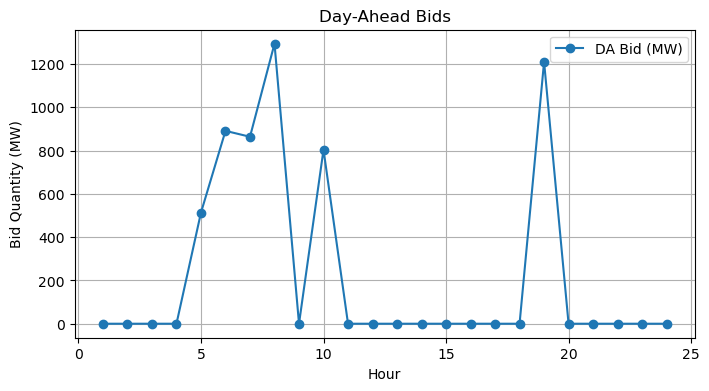

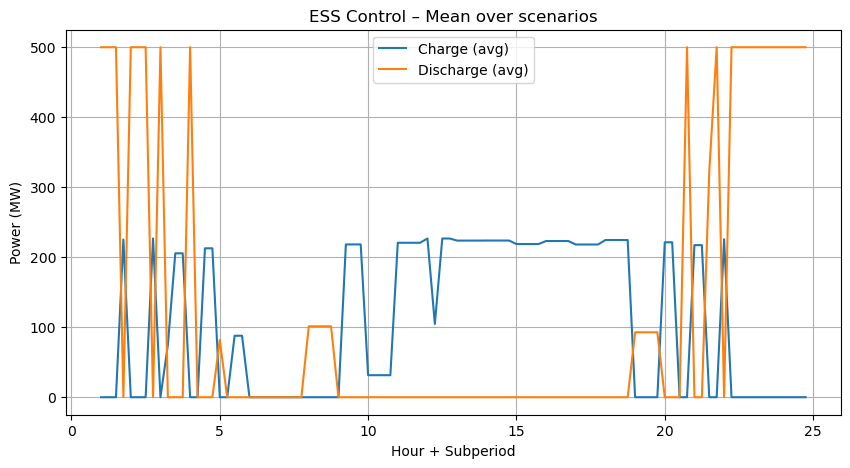

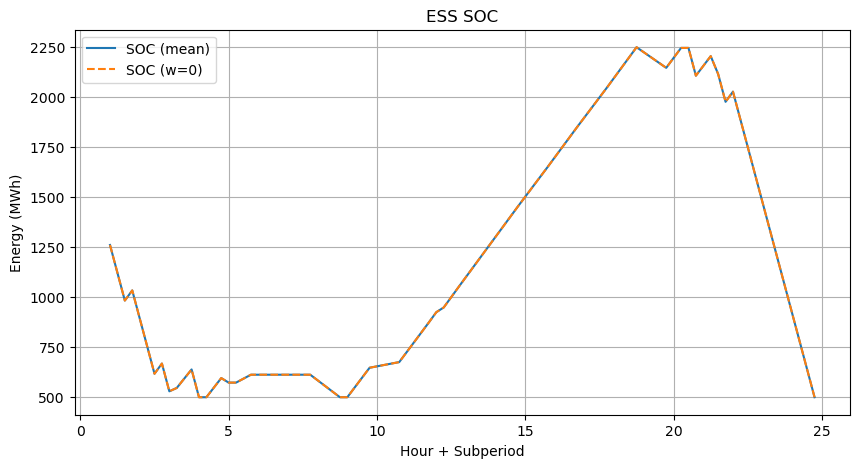

In [114]:
import matplotlib.pyplot as plt

# --- DA 입찰 ---
plt.figure(figsize=(8,4))
plt.plot(T, [p_bid_sol[t] for t in T], marker='o', label="DA Bid (MW)")
plt.xlabel("Hour")
plt.ylabel("Bid Quantity (MW)")
plt.title("Day-Ahead Bids")
plt.grid(True)
plt.legend()
plt.show()

# --- ESS Charging/Discharging (평균) ---
plt.figure(figsize=(10,5))
plt.plot([t+(j-1)*0.25 for t in T for j in J],
         [p_c_mean[(t,j)] for t in T for j in J], label="Charge (avg)")
plt.plot([t+(j-1)*0.25 for t in T for j in J],
         [p_d_mean[(t,j)] for t in T for j in J], label="Discharge (avg)")
plt.xlabel("Hour + Subperiod")
plt.ylabel("Power (MW)")
plt.title("ESS Control – Mean over scenarios")
plt.grid(True)
plt.legend()
plt.show()

# --- SOC (평균 vs w0) ---
plt.figure(figsize=(10,5))
plt.plot([t+(j-1)*0.25 for t in T for j in J],
         [E_mean[(t,j)] for t in T for j in J], label="SOC (mean)")
plt.plot([t+(j-1)*0.25 for t in T for j in J],
         [E_w0[(t,j)] for t in T for j in J], label="SOC (w=0)", linestyle="--")
plt.xlabel("Hour + Subperiod")
plt.ylabel("Energy (MWh)")
plt.title("ESS SOC")
plt.grid(True)
plt.legend()
plt.show()


In [115]:
# --------------------------
# 1) DA 입찰 (공통)
# --------------------------
df_bid = pd.DataFrame({
    "Hour": T,
    "p_bid": [p_bid_sol[t] for t in T],
    "ChosenBlock": [chosen_b[t] for t in T]
})
df_bid.to_csv("result_bid.csv", index=False, encoding="utf-8-sig")

# --------------------------
# 2) ESS 평균 제어 결과
# --------------------------
rows = []
for t in T:
    for j in J:
        rows.append({
            "Hour": t,
            "Subperiod": j,
            "Charge_mean": p_c_mean[(t,j)],
            "Discharge_mean": p_d_mean[(t,j)],
            "SOC_mean": E_mean[(t,j)]
        })
df_mean = pd.DataFrame(rows)
df_mean.to_csv("result_ess_mean.csv", index=False, encoding="utf-8-sig")

# --------------------------
# 3) ESS 시나리오별 결과 (w 전체)
# --------------------------
rows = []
for w in W:
    for t in T:
        for j in J:
            rows.append({
                "Scenario": w,
                "Hour": t,
                "Subperiod": j,
                "Charge": p_c[t,j,w].X,
                "Discharge": p_d[t,j,w].X,
                "SOC": E_q[t,j,w].X
            })
df_all = pd.DataFrame(rows)
df_all.to_csv("result_ess_all.csv", index=False, encoding="utf-8-sig")


비교

In [122]:
# 불러오기
df_bid = pd.read_csv("result_bid.csv")
df_mean = pd.read_csv("result_ess_mean.csv")

# merge (t 기준으로 join, Subperiod까지 확장)
df_merged = pd.merge(
    df_mean,
    df_bid[["Hour", "p_bid", "ChosenBlock"]],
    on="Hour",
    how="left"
)

# 컬럼 순서 정리 (solution_da_rt 스타일)
df_merged = df_merged[[
    "Hour", "Subperiod", "ChosenBlock", "p_bid",
    "Charge_mean", "Discharge_mean", "SOC_mean"
]]

# 저장
df_merged.to_csv("solution_da_rt_like.csv", index=False, encoding="utf-8-sig")
print("saved: solution_da_rt_like.csv")

saved: solution_da_rt_like.csv


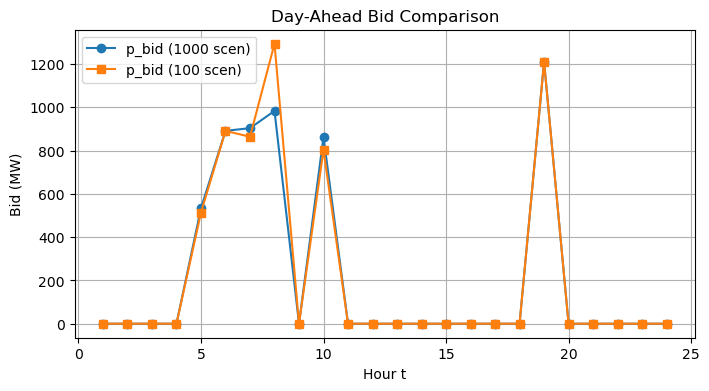

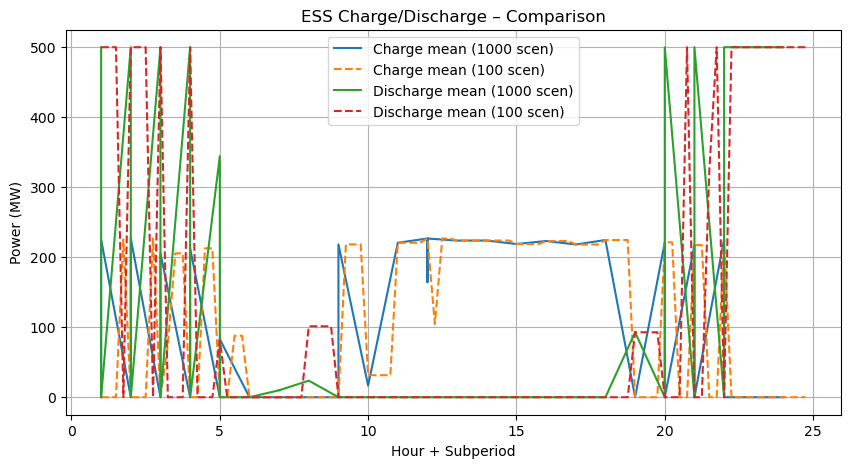

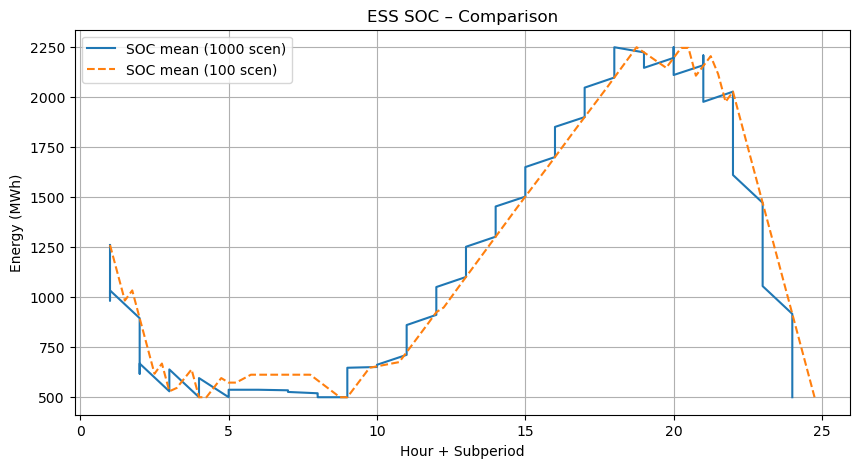

In [124]:
# 두 결과 불러오기
df_old = pd.read_csv("solution_da_rt.csv")         # 1000 scen
df_new = pd.read_csv("solution_da_rt_like.csv")    # 100 scen

# 컬럼명 통일 (df_new → df_old 스타일)
df_new = df_new.rename(columns={
    "Hour": "t",
    "Subperiod": "j",
    "ChosenBlock": "chosen_b",
    "Charge_mean": "p_c_mean",
    "Discharge_mean": "p_d_mean",
    "SOC_mean": "E_mean"
})

# (1) Day-Ahead 입찰 비교 (t 단위)
plt.figure(figsize=(8,4))
plt.plot(df_old["t"].unique(), df_old.groupby("t")["p_bid"].first(), marker="o", label="p_bid (1000 scen)")
plt.plot(df_new["t"].unique(), df_new.groupby("t")["p_bid"].first(), marker="s", label="p_bid (100 scen)")
plt.xlabel("Hour t")
plt.ylabel("Bid (MW)")
plt.title("Day-Ahead Bid Comparison")
plt.grid(True)
plt.legend()
plt.show()

# (2) ESS 충전/방전 평균 비교 (t,j 단위 → 연속 시간축 변환)
time_old = [t + (j-1)*0.25 for t,j in zip(df_old["t"], df_old.get("j", [1]*len(df_old)))]
time_new = [t + (j-1)*0.25 for t,j in zip(df_new["t"], df_new.get("j", [1]*len(df_new)))]

plt.figure(figsize=(10,5))
plt.plot(time_old, df_old["p_c_mean"], label="Charge mean (1000 scen)")
plt.plot(time_new, df_new["p_c_mean"], label="Charge mean (100 scen)", linestyle="--")
plt.plot(time_old, df_old["p_d_mean"], label="Discharge mean (1000 scen)")
plt.plot(time_new, df_new["p_d_mean"], label="Discharge mean (100 scen)", linestyle="--")
plt.xlabel("Hour + Subperiod")
plt.ylabel("Power (MW)")
plt.title("ESS Charge/Discharge – Comparison")
plt.grid(True)
plt.legend()
plt.show()

# (3) SOC 평균 비교
plt.figure(figsize=(10,5))
plt.plot(time_old, df_old["E_mean"], label="SOC mean (1000 scen)")
plt.plot(time_new, df_new["E_mean"], label="SOC mean (100 scen)", linestyle="--")
plt.xlabel("Hour + Subperiod")
plt.ylabel("Energy (MWh)")
plt.title("ESS SOC – Comparison")
plt.grid(True)
plt.legend()
plt.show()


In [128]:
# 기대 파라미터
mu_lambda_da = {(t,b): sum(rho_w[w]*lambda_da_big[(t,b,w)] for w in W)
                for t in T for b in valid_blocks[t]}
mu_qini      = {(t,b): sum(rho_w[w]*qini_big[(t,b,w)]      for w in W)
                for t in T for b in valid_blocks[t]}
mu_qmax      = {(t,b): sum(rho_w[w]*qmax_big[(t,b,w)]      for w in W)
                for t in T for b in valid_blocks[t]}
mu_rt        = {(t,j): sum(rho_w[w]*rt_big[(t,j,w)]        for w in W)
                for t in T for j in J}
mu_pwf       = {(i,t): sum(rho_w[w]*pwf_big[(i,t,w)]       for w in W)
                for i in I for t in T}
